# **Project Name**    - Regression - Bike Sharing Demand Prediction



##### **Project Type**    - EDA/Regression
##### **Contribution**    - Individual

# **Project Summary -**

In the present context of the project, the objective is to develop a predictive model which effectively predicts the count of rental cars depending on different variables like seasons, time and other factors. The data on the rented bike has different variables like the season, hour, humidity, and several environmental factors and the count of the bikes in every entry. This data provides an idea of how these different factors impact the count of bikes rented. The data analyses are the key objectives of the project and for this, different methods of exploratory data analyses are done. These analyses can help determine how these factors are related to the rented bike. This also provides insights into the business operations and some effective measures for business analysis are accomplished.


Another important aspect of the project is developing a hypothesis based on the exploratory data analysis. Three different hypotheses are developed and testing the hypothesis with Pearson Correlation and ANOVA tests (where appropriate), the hypothesis is verified.


The next phase of the project includes the development of a predictive model using different regression methods like linear, random forest and XGB regression. The accuracy scores of the different regression and Grid search Hyperparameter tuning accuracy scores have been compared. The prediction model is tested by predicting the values and comparing them with the test values which have been separated while the data split.

# **GitHub Link -**

https://github.com/sm292/Bike-Sharing-Demand-Prediction

# **Problem Statement**


**The project can be objectified in terms of delivering a suitable prediction model for the rented bikes. In the context of the gathered data, the characteristics of the bike rented are to be analysed in terms of different segments and categories. This reflects how people rent bikes based on the different seasons, time of year, and time of day. The analysed data is subjected to help predict the suitable time and seasons for the bike rental business which can help the business owners make necessary business decisions.**

---

The owners of the rental bike businesses can be helped by the predictive model in terms of managing their inventory to meet the requirements of the customers. This also includes developing effective pricing strategies for different seasons to attract customers in different seasons. These can help balance their profit over the year and it also helps retain the business.

---

> The primary objective of the specific project work is to determine an effective model with higher accuracy which can help develop suitable predictions of the bike rent for different factors like hours of day, season and so on.



## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np

### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load Dataset
bike_data = pd.read_csv('/content/drive/MyDrive/Module 6 Machine Learning/Capstone Project/SeoulBikeData.csv', encoding='cp949')

### Dataset First View

In [ ]:
# Dataset First Look
bike_data.head()

,Date,Rented Bike Count,Hour,Temperature(캜),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(캜),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print('Rows:'+ str(bike_data.shape[0]))
print('Columns:'+ str(bike_data.shape[1]))

Rows:8760
Columns:14


### Dataset Information

In [ ]:
# Dataset Info
bike_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      8760 non-null   object 
 1   Rented Bike Count         8760 non-null   int64  
 2   Hour                      8760 non-null   int64  
 3   Temperature(캜)            8760 non-null   float64
 4   Humidity(%)               8760 non-null   int64  
 5   Wind speed (m/s)          8760 non-null   float64
 6   Visibility (10m)          8760 non-null   int64  
 7   Dew point temperature(캜)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)   8760 non-null   float64
 9   Rainfall(mm)              8760 non-null   float64
 10  Snowfall (cm)             8760 non-null   float64
 11  Seasons                   8760 non-null   object 
 12  Holiday                   8760 non-null   object 
 13  Functioning Day           8760 non-null   object 
dtypes: float

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
bike_data.duplicated().value_counts()

False    8760
Name: count, dtype: int64

**No Duplicate Values**

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
bike_data.isnull().sum()

Date                        0
Rented Bike Count           0
Hour                        0
Temperature(캜)              0
Humidity(%)                 0
Wind speed (m/s)            0
Visibility (10m)            0
Dew point temperature(캜)    0
Solar Radiation (MJ/m2)     0
Rainfall(mm)                0
Snowfall (cm)               0
Seasons                     0
Holiday                     0
Functioning Day             0
dtype: int64

**No Missing Values**

<Axes: >

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 52892 (\N{HANGUL SYLLABLE KAELS}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52892 (\N{HANGUL SYLLABLE KAELS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


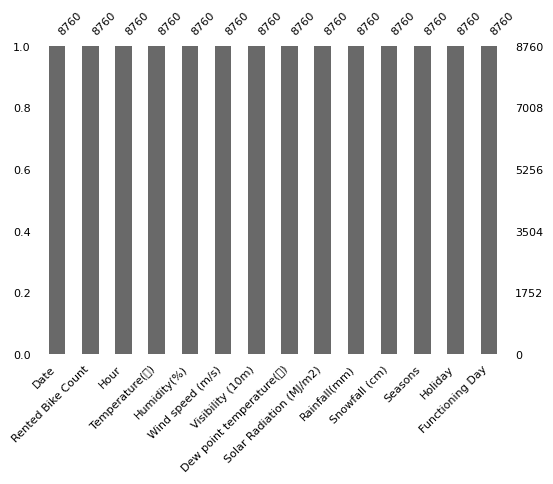

In [ ]:
# Visualizing the missing values
import missingno as msno
msno.bar(bike_data, fontsize = 8,figsize=(6,4))

**No Missing Values**

### What did you know about your dataset?

The following table encapsulates the different variables present in the data and some basic insights about the data are also gathered. This includes the fact that the data has no duplicated values or null values. This helps identify some effective measures for the data where no data exclusion or data inclusion is required to balance the duplicated or null values.

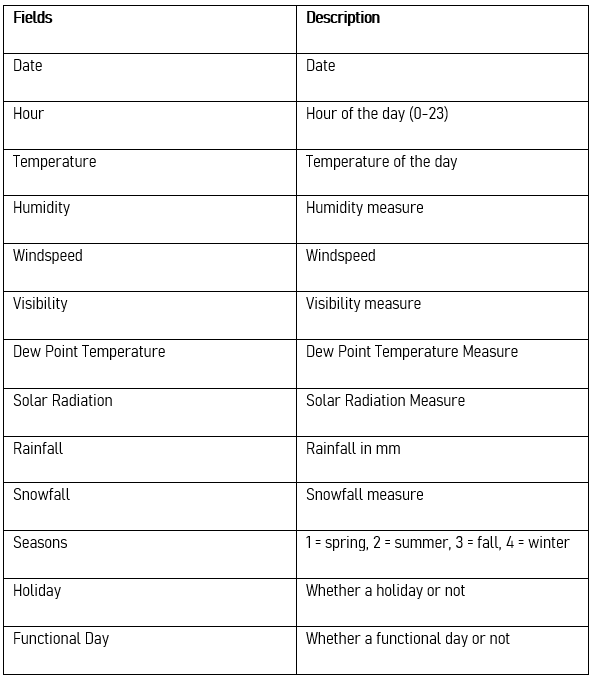

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
bike_data.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(캜)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(캜)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [ ]:
# Dataset Describe
bike_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.602055,644.997468,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.500000,6.922582,0.0,5.75,11.50,17.25,23.00
Temperature(캜),8760.0,12.882922,11.944825,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.226256,20.362413,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.724909,1.036300,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.825799,608.298712,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(캜),8760.0,4.073813,13.060369,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.569111,0.868746,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.148687,1.128193,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.075068,0.436746,0.0,0.00,0.00,0.00,8.80


### Variables Description

The total data count is 8760 and the other descriptive statistics are also shown. The mean, standard deviation and minimum and maximum values of the variables are shown which also includes the 1st, 2nd, and 3rd quartile values of the variables.

### Check Unique Values for each variable.

In [ ]:
# Checking Unique Values for each variable.
bike_data.nunique()

Date                         365
Rented Bike Count           2166
Hour                          24
Temperature(캜)               546
Humidity(%)                   90
Wind speed (m/s)              65
Visibility (10m)            1789
Dew point temperature(캜)     556
Solar Radiation (MJ/m2)      345
Rainfall(mm)                  61
Snowfall (cm)                 51
Seasons                        4
Holiday                        2
Functioning Day                2
dtype: int64

##  ***3. Data Wrangling***

### Data Wrangling Code

In [ ]:
bike_data.head()

,Date,Rented Bike Count,Hour,Temperature(캜),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(캜),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
# Making the dataset analysis ready.

# Changing the Names of the Columns or Variables in Simple Terms

bike_data.rename({"Temperature(캜)": "Temperature",
               "Functioning Day":"Functioning_Day",
                "Humidity(%)": "Humidity",
                "Wind speed (m/s)": "Wind_speed",
                "Visibility (10m)": "Visibility",
                "Dew point temperature(캜)": "Dew_point_temperature",
                "Solar Radiation (MJ/m2)": "Solar_Radiation",
                "Snowfall (cm)": "Snowfall",
                "Rainfall(mm)": "Rainfall",
                "Rented Bike Count": "Rented_Bike_Count"},
                axis = "columns", inplace = True)

In [ ]:
bike_data.head()

,Date,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
# Importing librariers and methods for Data Wrangling
from datetime import datetime
import calendar

In [ ]:
bike_data['Date'] = pd.to_datetime(bike_data['Date'], format="%d/%m/%Y") #Converting the Date Column from Object to DateTime Format

In [ ]:
bike_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   8760 non-null   datetime64[ns]
 1   Rented_Bike_Count      8760 non-null   int64         
 2   Hour                   8760 non-null   int64         
 3   Temperature            8760 non-null   float64       
 4   Humidity               8760 non-null   int64         
 5   Wind_speed             8760 non-null   float64       
 6   Visibility             8760 non-null   int64         
 7   Dew_point_temperature  8760 non-null   float64       
 8   Solar_Radiation        8760 non-null   float64       
 9   Rainfall               8760 non-null   float64       
 10  Snowfall               8760 non-null   float64       
 11  Seasons                8760 non-null   object        
 12  Holiday                8760 non-null   object        
 13  Fun

In [ ]:
#Extracting month from date column
bike_data['month'] = pd.DatetimeIndex(bike_data['Date']).month
bike_data['month'] = bike_data['month'].apply(lambda x: calendar.month_abbr[x])

#Extracting day name
bike_data['day'] = bike_data['Date'].dt.day_name()

#Extracting year
bike_data['year'] = bike_data['Date'].dt.year

In [ ]:
bike_data.head()

,Date,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,month,day,year
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017


In [ ]:
bike_data.drop('Date', axis = 1, inplace = True) #Dropping Date Column

In [ ]:
# Creating Week Column from the Day information by using Lambda function
bike_data['Week'] = bike_data['day'].apply(lambda x:'Weekend'  if x=='Saturday' or  x== 'Sunday' else 'Working Day')

In [ ]:
# Creating Time Period Column from the Hour information by using Lambda function
bike_data['Time_Period'] = bike_data['Hour'].apply(lambda x:'Morning'  if x < 12 else 'Afternoon' if (x >=12) and (x < 18) else 'Night')

In [ ]:
bike_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   int64  
 1   Hour                   8760 non-null   int64  
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  month                  8760 non-null   object 
 14  day                    8760 non-null   object 
 15  year

### What all manipulations have you done and insights you found?

Several Modifications are done to make the data ready for visualisation, hypothesis, and machine learning models. In the present context, some primary modifications are accomplished which include changing the names of the columns, transforming the date column from object to datetime format, and fetching Day, and Month data from the Date Column. This also includes the Week and Time_period Columns which are developed using functions on day and hour columns respectively.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

In [ ]:
# Importing Visualisation Library

import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
bike_data.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'month', 'day',
       'year', 'Week', 'Time_Period'],
      dtype='object')

#### Chart - Bar Plots for Categorical Variables

***BIVARIATE ANALYSIS - Numerical-Categorical***

In [ ]:
# Extracting features of the Object Type Data

features = bike_data.select_dtypes(include = 'object').columns.tolist()
features

['Seasons',
 'Holiday',
 'Functioning_Day',
 'month',
 'day',
 'Week',
 'Time_Period']

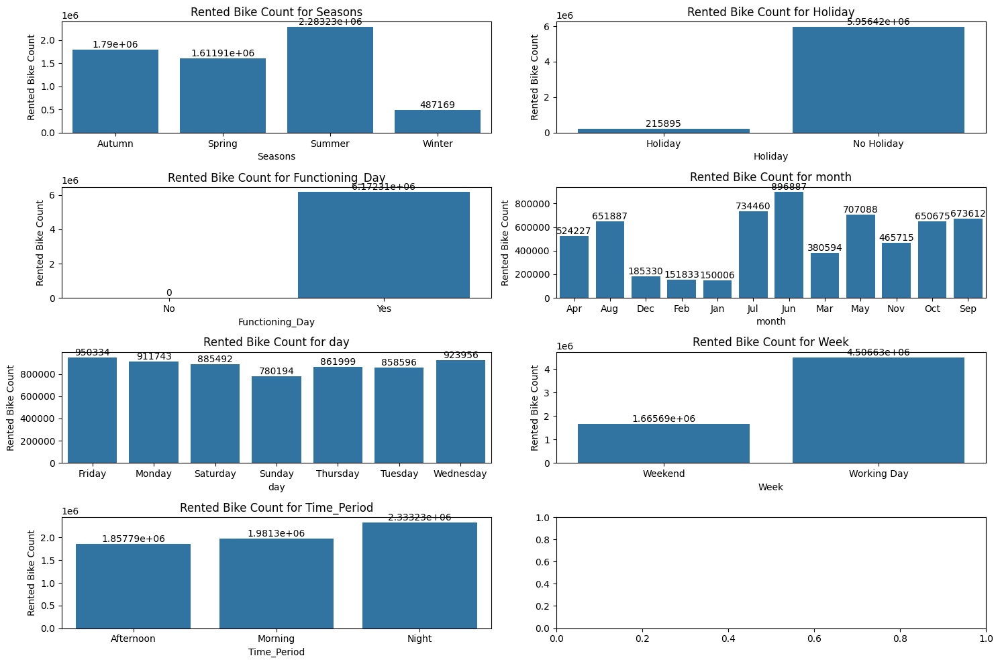

In [ ]:
# Plotting the Rented Bike Count Summation with respect to Values of Categorical Variables

plt.subplots(4,2,figsize=(15,10))
for i, col in enumerate(features):
  Rented_Bike_Count = bike_data.groupby(col).agg(mean_count =('Rented_Bike_Count','sum'))
  plt.subplot(4,2,i+1)
  ax = sns.barplot(x = Rented_Bike_Count.index, y = 'mean_count', data = Rented_Bike_Count)
  ax.bar_label(ax.containers[0])
  plt.xlabel(f'{col}')
  plt.ylabel('Rented Bike Count')
  plt.title(f'Rented Bike Count for {col}')
  plt.tight_layout()


##### 1. Why did you pick the specific chart?

This specific chart group is selected in order to understand the distribution of the main variable, the bike count, in diffetent segements of the other categorical variables. This is an effective method for Bivariate Analysis with the categorical and Target Data.

##### 2. What is/are the insight(s) found from the chart?


* It can be observed from the groups of graph that the Summer Seasond have high count of bikes compared to other sesons. Winter has the lowest bookings.
* The graph also shows that Holidays have less rented bike.
* The next graph helps visualise the Rented bikes are sold on functioning days and no bookings were observed on non-functioning day.
* June has the highest boookings as per next graph and lowest bookings are observed in January.
* Least Bookings are observed on Sunday in comparison to other days.
* Working Day has higher bookings than Weekends
* Night or Evening is relatively higher booking than the other times of the day.

##### 3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.

* Seaons-  Summer is the best Season for the Business and opposite is the winter which can help in developing pricing strategies
* Holiday - Non-Holidays are the best for the business
* Functioning Day - Functioning Days are the best for business
* Month -  All the months have bookings but the June is the best time for business
* Days - Except Sundays, all the days are good for business
* Weekends - Weekdays are the best time for business
* Time of Day - Night or Evening Times are the best time for the business


The best times and worst times of business helps the service providers to develop effective marketing and pricing strategies. This also helps develop idea on how the business can prosper according to different time aspects.

#### Chart - Box Plots for Numerical Variables

***UNIVARIATE ANALYSIS***

In [ ]:
# Extracting NUmerical Features from Data

num_features = bike_data.select_dtypes(include = 'number').columns.tolist()
num_features

['Rented_Bike_Count',
 'Hour',
 'Temperature',
 'Humidity',
 'Wind_speed',
 'Visibility',
 'Dew_point_temperature',
 'Solar_Radiation',
 'Rainfall',
 'Snowfall',
 'year']

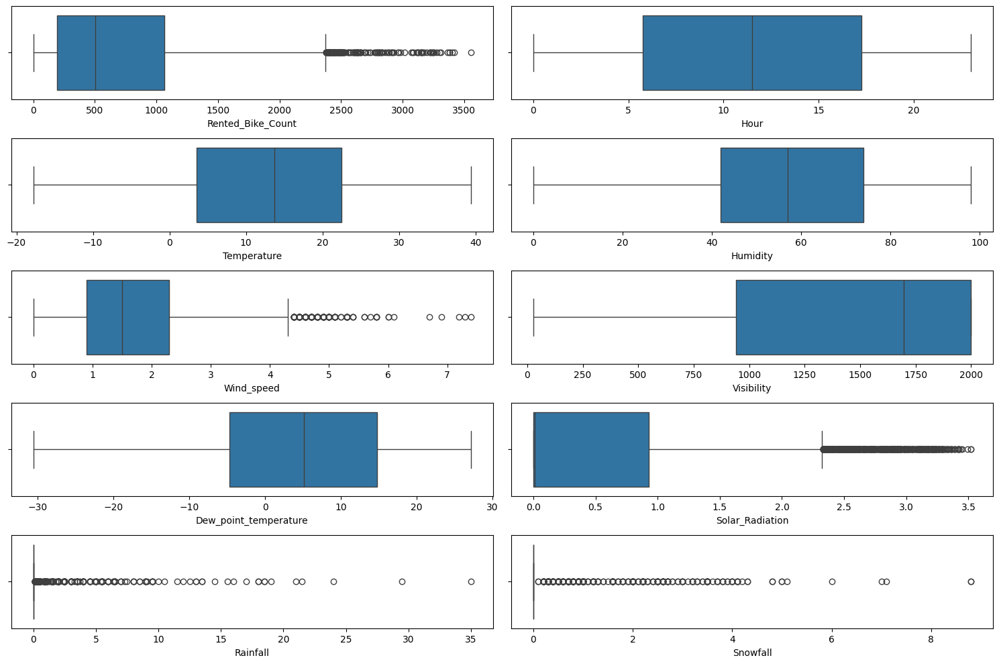

In [ ]:
# Plotting the Numerical Feature of the Data with Box plot

if 'year' in num_features:
  num_features.remove('year')

plt.subplots(5,2,figsize=(15,10))
for i,col in enumerate(num_features):
  plt.subplot(5,2,i+1)
  sns.boxplot(x=bike_data[col])
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

The boxplot helps identify the Univariate Analysis of the numerical features. In terms of deriving the distribution of data within first to third quartile of the complete data. The features like Rented Bike Count, Hour, Tempeature, Humidity, Wind Speed, Visibility, Dew Point Temperature, Solar Radiation, Rainfall, and Snowfall, are observed in these plots.

##### 2. What is/are the insight(s) found from the chart?

It provides an idea how the data is distributed and the presence and absence of the anomalities present in the data are analysed.

#### Chart - Line Plots for Bike Rent for Hours for Different Categorical Values

***MULTIVARIATE ANALYSIS***

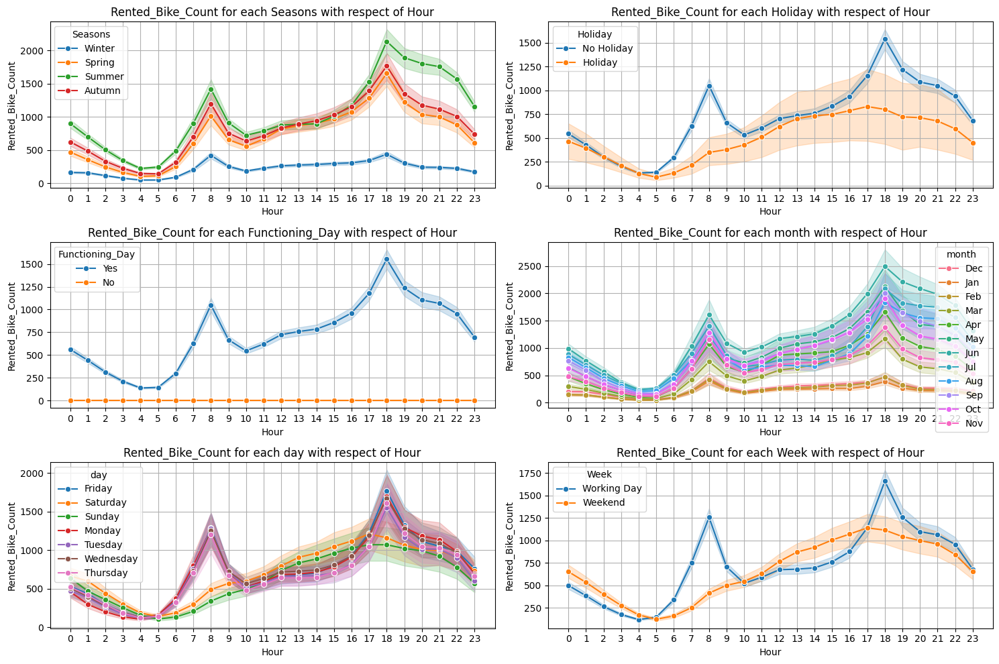

In [ ]:

# Bike Rent Data vs. Hour (with respect to Different Categorical Values)

plt.subplots(3,2,figsize=(15,10))

for i in features:
  if i != 'Time_Period':
    plt.subplot(3,2,features.index(i)+1)
    sns.lineplot(x = 'Hour', y = 'Rented_Bike_Count', data = bike_data, hue = bike_data[i], marker ='o')
    plt.xticks(range(24))
    plt.grid()
    plt.title(f"Rented_Bike_Count for each {i} with respect of Hour")
    plt.tight_layout()

##### 1. Why did you pick the specific chart?

The reason for choosing the line plot is to visualise the hourly distribution of the rented car count in different seasons and days. This is subjected to identify how the car renting is done in different hours of the day for different seasons, holiday, Functioning Day, Month, Day, and Week.

##### 2. What is/are the insight(s) found from the chart?

Insights found in the charts include:


*   In different seasons, the peak hours are 8th and 18th hours
*   Same trend is observed for the No Holiday, the holiday grpah varies
*   Same trend is observed for the Functioning Day, no count (0) location is observed for not functioning days
*   In different months also, the peak hours are 8th and 18th hours and same trend is observed over the different hours as before
*   Except Saturday and Sunday, the same trend is observed
*   Except Weekend, in this case also, the same trend is observed




##### 3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.

This provides an idea about the peak hours when the count of rented bikes are high and it helps detemine the strategies to deal with the rush hours by primarily detecting the different rush hours.

#### Chart - Density plots of Numerical Variables

***UNIVARIATE ANALYSIS***

In [ ]:
# Density Plot of the Numerical Features of the Data


def density_plot(dfr,num_feature):
  '''
  Definition of Density Plot
  Input: Dataframe, Numerical Features
  Output: Density Plot
  '''
  graph = plt.figure(figsize = (20,30))
  for i,col in enumerate(num_feature):
    plt.subplot(6,2,i+1)
    sns.histplot(dfr[col], color = '#055E85',kde=True, stat="density", kde_kws=dict(cut=3),alpha=.4, edgecolor=(1, 1, 1, .4))
    feature = dfr[col]
    plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean')  #red
    plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median') #cyan
    plt.title(f'{col.title()}')
    plt.tight_layout()

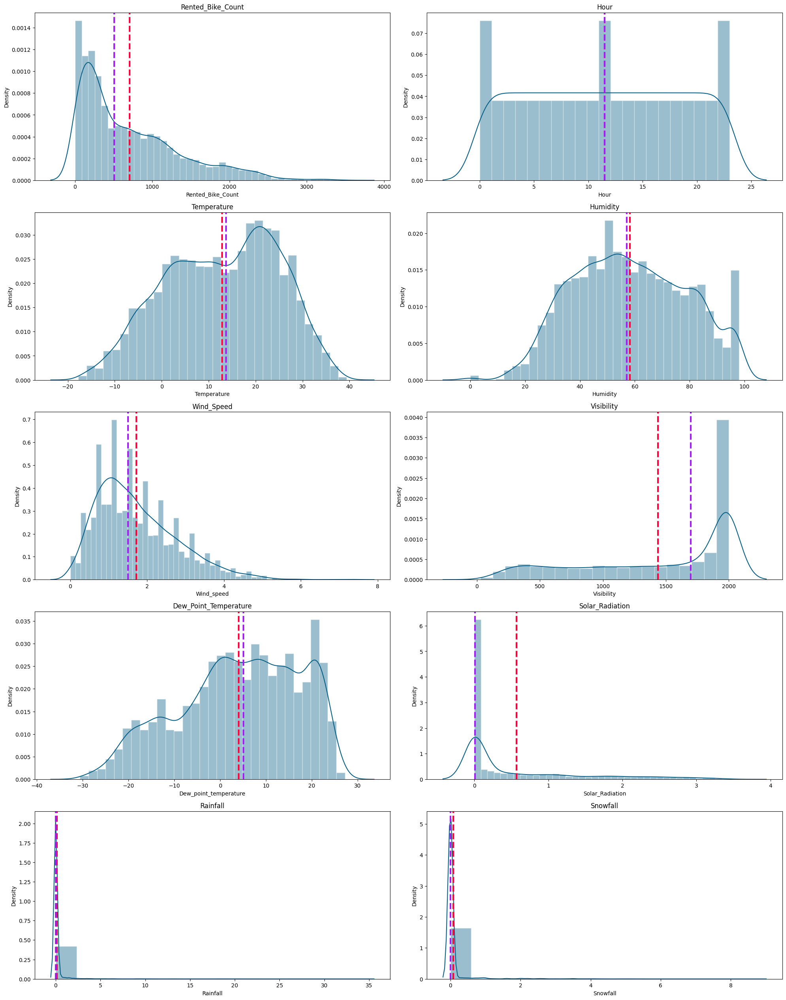

In [ ]:
density_plot(bike_data,num_features) # Calling Density Plot Function

In [ ]:
# Measure of Skewneess and Kurtosis of the Data

dfsk = pd.DataFrame()
for col in num_features:
  dfsk[col] = bike_data[col]

dfsk.agg(['skew', 'kurtosis']).T


,skew,kurtosis
Rented_Bike_Count,1.153428,0.853387
Hour,0.000000,-1.204176
Temperature,-0.198326,-0.837786
Humidity,0.059579,-0.803559
Wind_speed,0.890955,0.727179
Visibility,-0.701786,-0.961980
Dew_point_temperature,-0.367298,-0.755430
Solar_Radiation,1.504040,1.126433
Rainfall,14.533232,284.991099
Snowfall,8.440801,93.803324


##### 1. Why did you pick the specific chart?

The density plot and measures of skewness and kurtosis of the numerical features are essential to understand if the data is balanced. This information is essential for the steps later in the data preprocessing before training the machine learning models.

##### 2. What is/are the insight(s) found from the chart?

The chart provides an idea on how effectively the data is distributed over standard normal curve. The balanced property of the data is essential to understand if the data needs imputation. The data is not always properly balanced even measuring for different levels of accuracy.

##### 3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.

The charts helps undertand that the data needs imputation in the later phases to develop effective machine learning and prediction models.


#### Chart - Scatter Plot for Relations of Bike Rent with Numerical Varaibles

***BIVARIATE ANALYSIS - Numerical - Numerical***

In [ ]:
num_features

['Rented_Bike_Count',
 'Hour',
 'Temperature',
 'Humidity',
 'Wind_speed',
 'Visibility',
 'Dew_point_temperature',
 'Solar_Radiation',
 'Rainfall',
 'Snowfall']

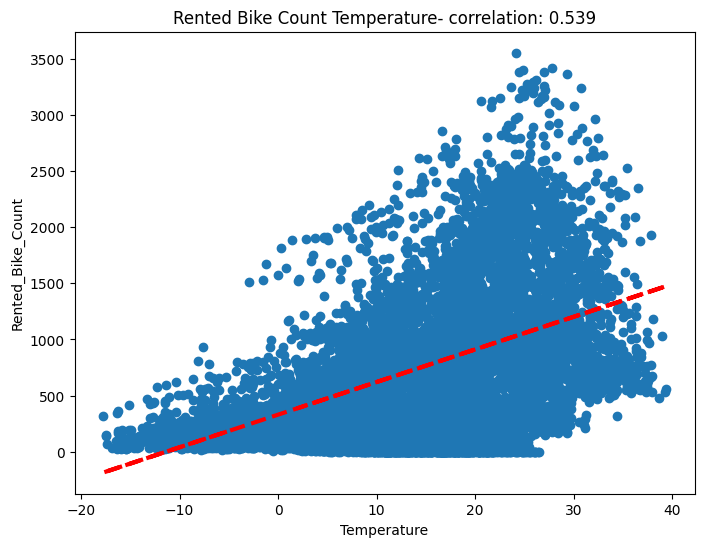

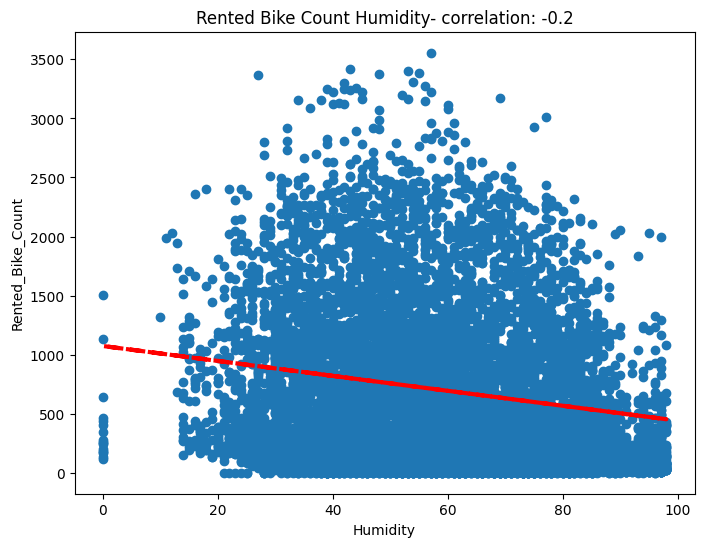

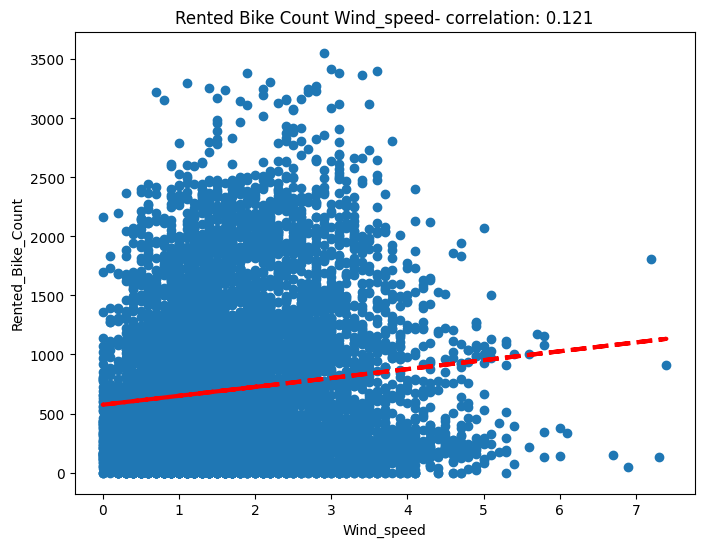

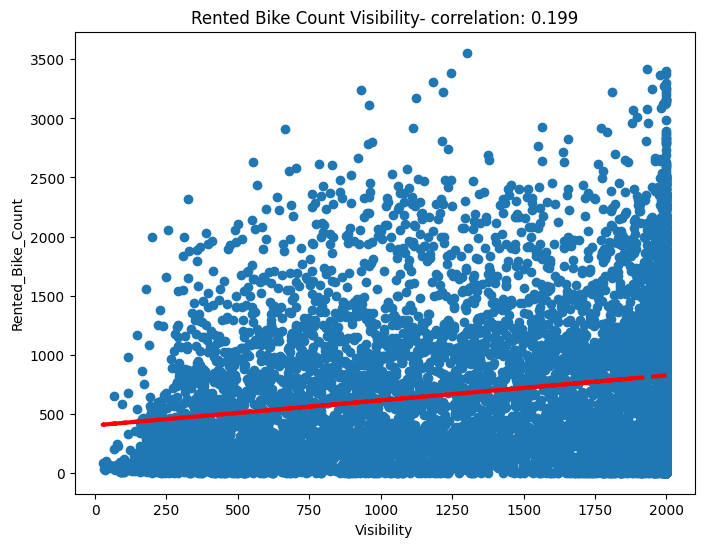

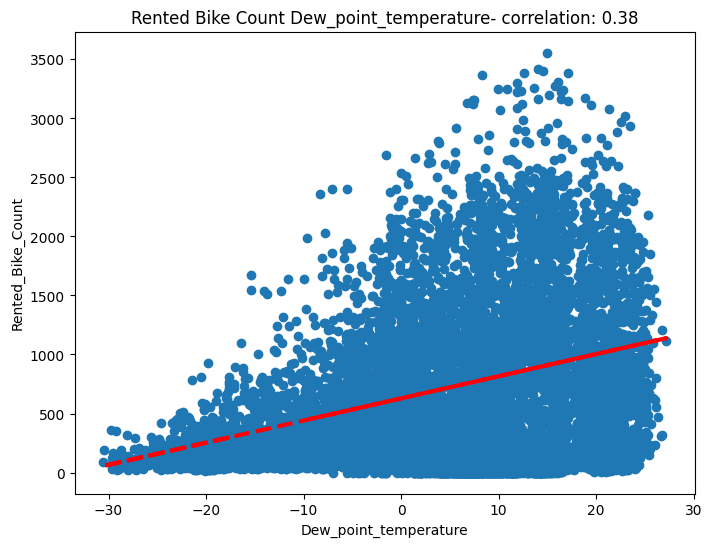

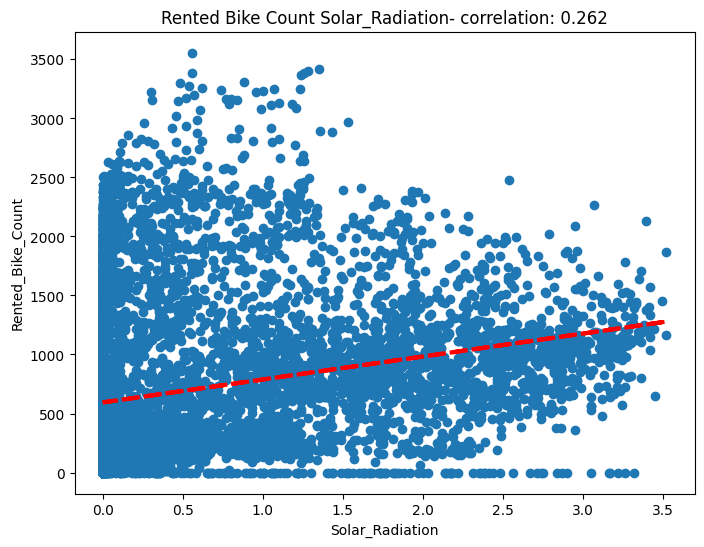

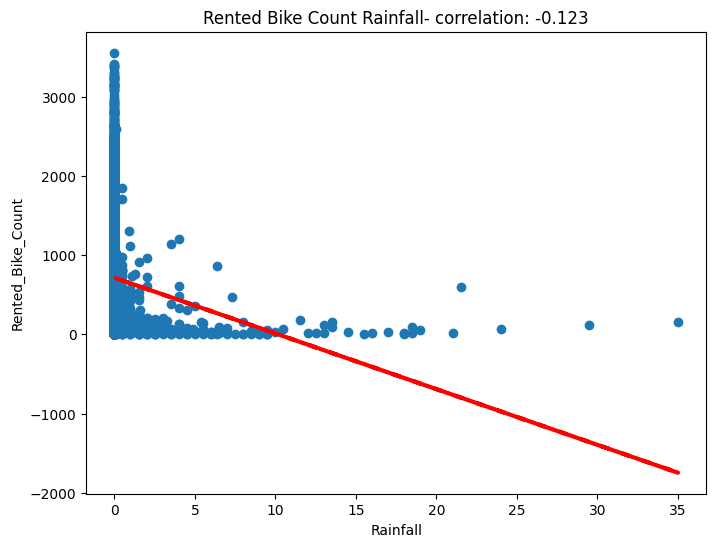

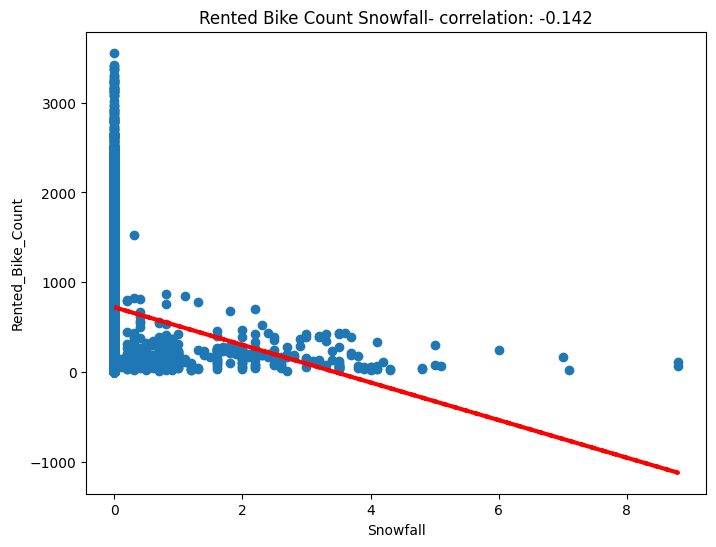

In [ ]:
# Plotting Rented Bike Count with respect to the numrical features

for i, fs in enumerate(num_features):
  if fs not in ('Rented_Bike_Count', 'Hour'):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.gca()
    feature = bike_data[bike_data.columns[i]]
    label = bike_data['Rented_Bike_Count']
    correlation = round(feature.corr(label),3)
    chart = plt.scatter(x=feature, y=label)
    plt.xlabel(fs)
    plt.ylabel('Rented_Bike_Count')
    ax.set_title('Rented Bike Count ' + fs + '- correlation: ' + str(correlation))
    z = np.polyfit(bike_data[bike_data.columns[i]], bike_data['Rented_Bike_Count'], 1)
    y_hat = np.poly1d(z)(bike_data[bike_data.columns[i]])

    plt.plot(bike_data[bike_data.columns[i]], y_hat, "r--", lw=3)
    print("="*100)

  plt.show()



##### 1. Why did you pick the specific chart?

The choice of scatter plot is effective to derive relationship between two numrical variables. In this context, the rented car count is related to the different factors of the enviroment like temperature, humidity, rainfall, snowfall, wind speed, visibility, and solar radiation.

##### 2. What is/are the insight(s) found from the chart?

It provides information on how the different environmental variables are related to the bike rent. This helps determine the dependence of the rented car count on these variables. This also provides a correlation score that provides relationship between the variables.

##### 3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.

This shows how different environmental variables are making concerns to people for renting bike. It helps deliver how the business operations are needed to be improved in different environmental conditions.

#### Chart - Pie Plots of Categorical Variable

***BIVARIATE - Categorical - Numerical***

In [ ]:
features

['Seasons',
 'Holiday',
 'Functioning_Day',
 'month',
 'day',
 'Week',
 'Time_Period']

In [ ]:
feats = features.copy()
feats.remove('Functioning_Day')
feats

['Seasons', 'Holiday', 'month', 'day', 'Week', 'Time_Period']

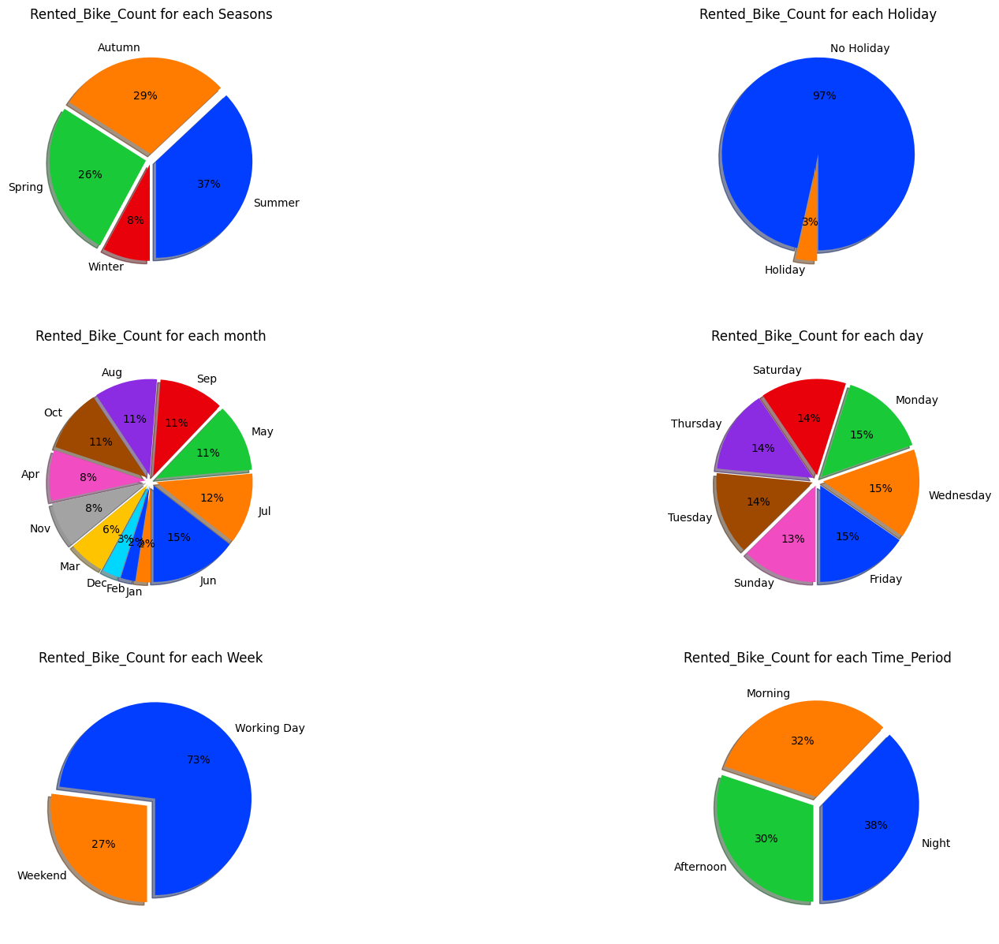

In [ ]:
# Plotting the Percentage of Rented Car Count with respect to categoical variables

plt.subplots(3,2,figsize=(20,15))
for i in feats:
  grp = bike_data.groupby([i], as_index = False)['Rented_Bike_Count'].sum().sort_values('Rented_Bike_Count',ascending = False)


  textprops = {"fontsize":10}
  #sns.set_context('poster')
  plt.subplot(3,2,feats.index(i)+1)
  palette_color = sns.color_palette('bright')
  chart = plt.pie(grp['Rented_Bike_Count'], labels= grp[i],shadow= True,autopct='%.0f%%',
                  radius = 0.9,
                  explode = [0.05]*len(grp),
                  colors = palette_color,
                  startangle = 270,
                  textprops =textprops)
  plt.title(f"Rented_Bike_Count for each {i}", fontsize=12)



##### 1. Why did you pick the specific chart?


The following points are the outputs of the graphical data of the rented bike car count:

1.   Seasons - In summer, the Percentage of rented bike count is the highest. Then comes autum and spring. The lowest percentage is observed in winter.
2.   Holiday - In no holiday, the percentage is higher.
3.   month - In June, the percentage is higher and the lowest is in January.
4.   day - The whole week has similar percentage.
5.   Week - Weekend has low percentage and week days have higher percentage.
6.   Time_Period - Night time has the highest percentage of rented car.


##### 2. What is/are the insight(s) found from the chart?

Same output is observed  as before and it provides same business insights.

##### 3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.

It cab help the business develop idea about implementing effective pricing and other business strategy.

#### Chart - Correlation Heatmap

In [ ]:
bike_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   int64  
 1   Hour                   8760 non-null   int64  
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  month                  8760 non-null   object 
 14  day                    8760 non-null   object 
 15  year

In [ ]:
dfsk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   int64  
 1   Hour                   8760 non-null   int64  
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
dtypes: float64(6), int64(4)
memory usage: 684.5 KB


In [ ]:
dfsk.head(2)

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0


<Axes: >

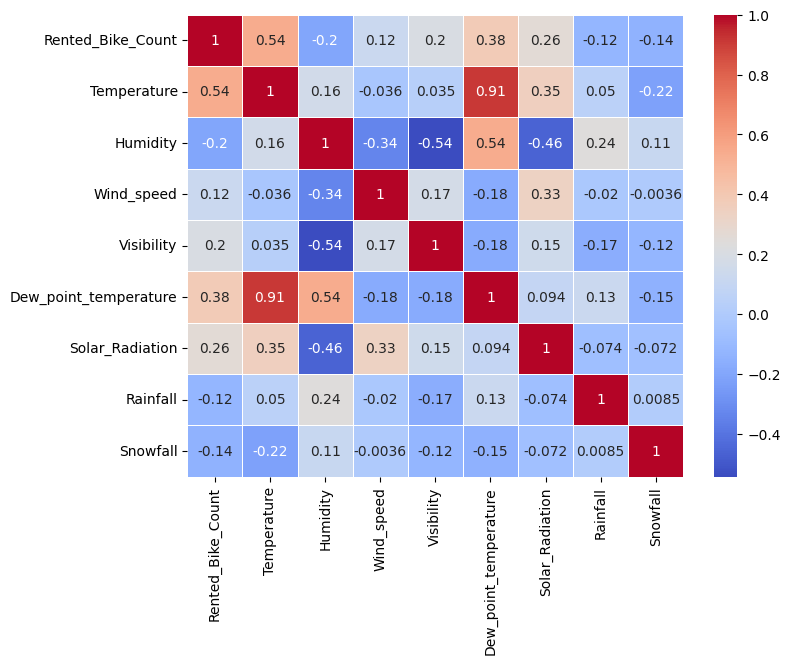

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize = (8,6))
plt.xticks(fontsize= 10)
plt.yticks(fontsize= 10)
dfco = dfsk.copy()
dfco.drop('Hour', axis = 1, inplace = True)
sns.heatmap(dfco.corr(), annot=True, linewidth=.5,cmap="coolwarm")

##### 1. Why did you pick the specific chart?

This plot provides a visual respresentation of the correlation between the different variables of the data.

##### 2. What is/are the insight(s) found from the chart?

The interdependence of the different numerical variables of the data is subjected to this visualisation.

#### Chart - Pair Plot

In [ ]:
dfsk.head(2)

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0


In [ ]:
dfpair = dfsk.copy()
dfpair['Seasons'] = bike_data['Seasons']
dfpair['Time_Period'] = bike_data['Time_Period']
dfpair.drop('Hour', axis = 1, inplace = True)

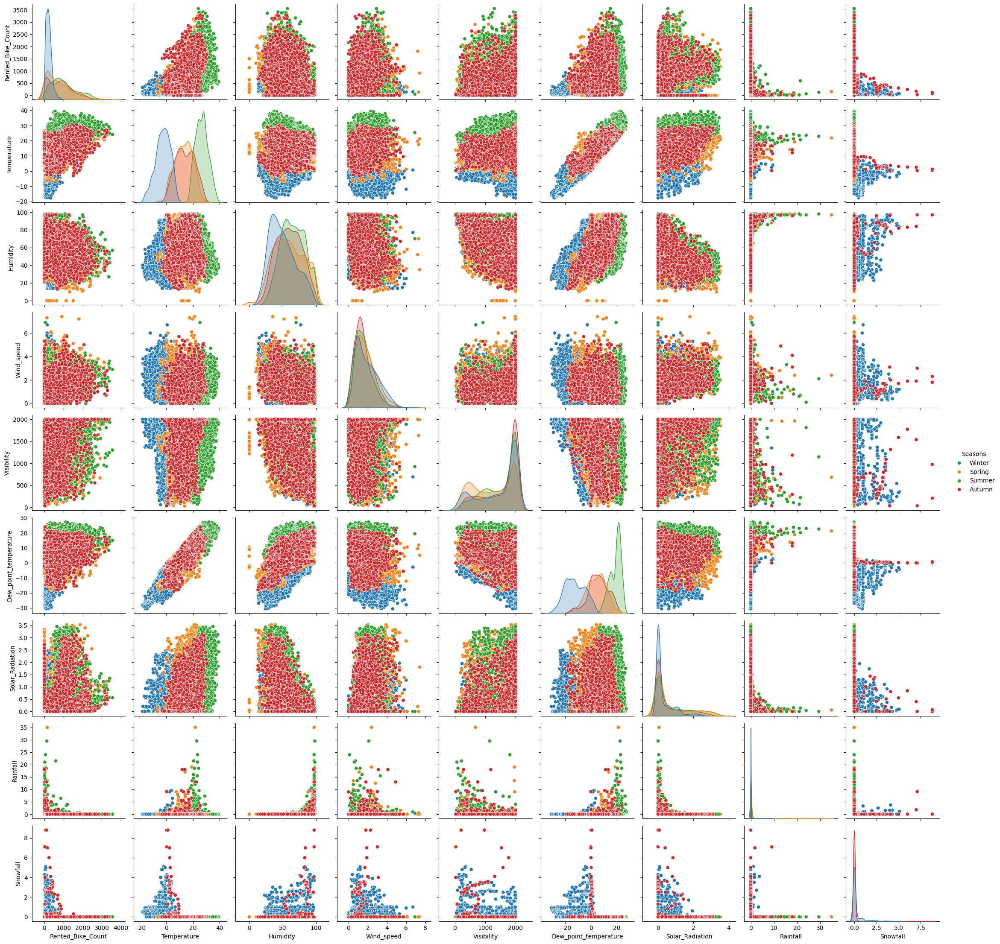

In [ ]:
# Pair Plot visualization code
sns.pairplot(dfpair, hue = 'Seasons')

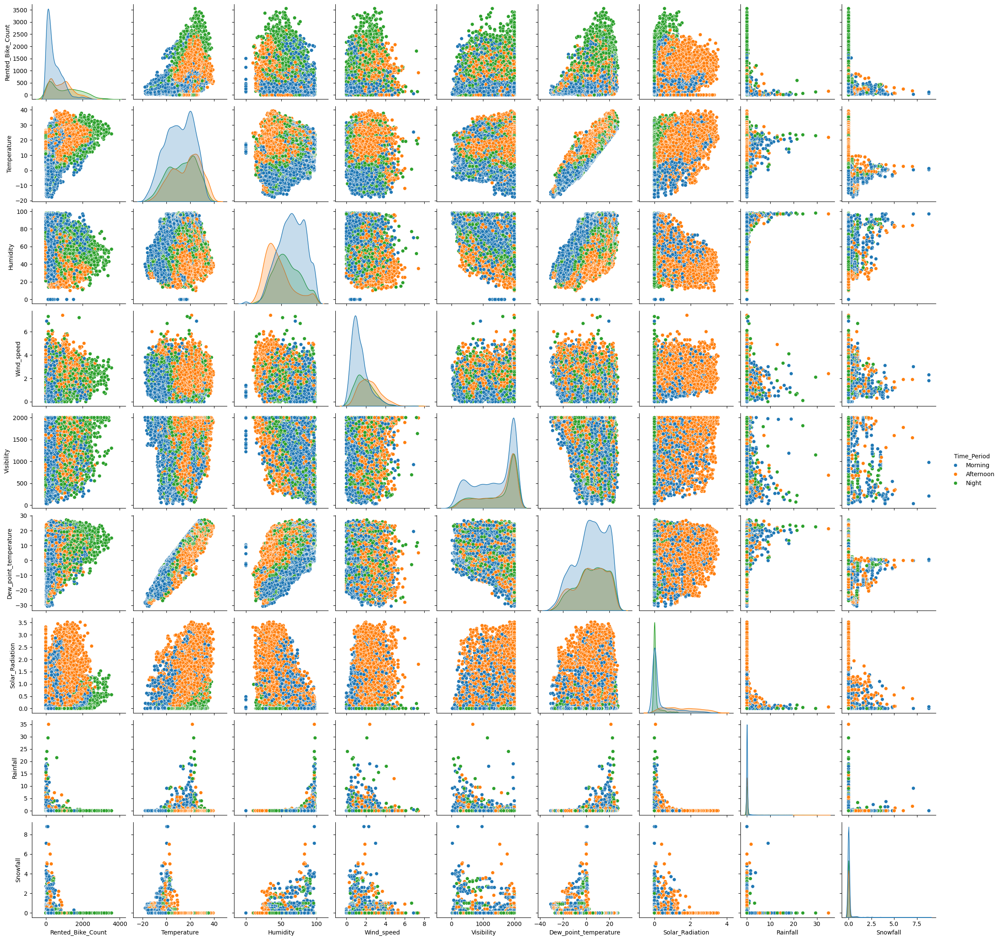

In [ ]:
sns.pairplot(dfpair, hue = 'Time_Period')

##### 1. Why did you pick the specific chart?

The first plot shows the interdependence of the variables through scatter plot with respect to different seasons.

The second plot shows the interdependence of the variables through scatter plot with respect to different time period.



##### 2. What is/are the insight(s) found from the chart?

These charts also provide the idea of how the numerical variables are correlated and a visual respresentation of the scatter plots are helpful in showing off the seasonal and time values data.

## ***5. Hypothesis Testing***

In [ ]:
bike_data.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,month,day,year,Week,Time_Period
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning


In [ ]:
# Importing Scipy library and Stats method

from scipy import stats

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1. The numnber of rented bikes has a dependability on the differences in seasons.
2. The number of rented bikes depends on the different time period of the day.
3. The number of rented bikes has a linear dependency on the temperature.

### Hypothetical Statement - 1 - Seasons

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

- H0: No difference in the numnber of rented bikes is observed due to differences in seasons.  
- H1: Different Seaons show major difference in the number of rented bikes.
- Test: Anova Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Defining null and alternative hypotheses
null_hypothesis = "No difference in the numnber of rented bikes is observed due to differences in seasons."
alternative_hypothesis = "Different Seaons show major difference in the number of rented bikes."

# Grouping data by seasons
data_by_season = bike_data.groupby('Seasons')

# Performing ANOVA test

F, p = stats.f_oneway(*[data_by_season['Rented_Bike_Count'].get_group(season)
                         for season in data_by_season.groups])
# Results of the Test
print(f"F-statistic: {F:.3f}")
print(f"p-value: {p:.3f}")
if p < 0.05:
   print(f"{alternative_hypothesis} (reject H0)")
else:
   print(f"{null_hypothesis} (fail to reject H0)")


F-statistic: 776.468
p-value: 0.000
Different Seaons show major difference in the number of rented bikes. (reject H0)


##### Which statistical test have you done to obtain P-Value?

Anova Test is done to obtain the p-value.

##### Why did you choose the specific statistical test?

The independent variable season is categorical and the dependent variable is numerical variable, rented bike count, which is quantitative. Hence, choosing the ANOVA test is appropriate, in this context.

### Hypothetical Statement - 2 - Time Period

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

- H0: The number of rented bikes does not depends on the different hours of the day.
- H1: The number of rented bikes depends on the different hours of the day.
- Test: ANOVA Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Defining null and alternative hypotheses
null_hypothesis = "The number of rented bikes does not depends on the different time period of the day."
alternative_hypothesis = "The number of rented bikes depends on the different time period of the day."

# Grouping data by time
data_by_time = bike_data.groupby('Time_Period')

# Performing ANOVA test

F, p = stats.f_oneway(*[data_by_time['Rented_Bike_Count'].get_group(time_period)
                         for time_period in data_by_time.groups])
# Results of the Test
print(f"F-statistic: {F:.3f}")
print(f"p-value: {p:.3f}")
if p < 0.05:
   print(f"{alternative_hypothesis} (reject H0)")
else:
   print(f"{null_hypothesis} (fail to reject H0)")

F-statistic: 878.628
p-value: 0.000
The number of rented bikes depends on the different time period of the day. (reject H0)


##### Which statistical test have you done to obtain P-Value?

ANOVA Test is used to obtain the p-value

##### Why did you choose the specific statistical test?

The independent variable time period is categorical and the dependent variable is numerical variable, rented bike count, which is quantitative. Hence, choosing the ANOVA test is appropriate, in this context.

### Hypothetical Statement - 3 - Temperature

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

- H0: The number of rented bikes has a no dependency on the temperature.
- H1: The number of rented bikes has a linear dependency on the temperature.
- Test: Pearson correlation test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Define the null and alternative hypotheses
null_hypothesis = "The number of rented bikes has a no dependency on the temperature."
alternative_hypothesis = "The number of rented bikes has a linear dependency on the temperature."

# Calculate the correlation between temperature and the number of rented bikes
r, p = stats.pearsonr(bike_data['Temperature'], bike_data['Rented_Bike_Count'])

# Print the result of the test
print(f"Correlation coefficient: {r:.3f}")
print(f"p-value: {p:.3f}")
if p < 0.05:
   print(f"{alternative_hypothesis} (reject H0)")
else:
   print(f"{null_hypothesis} (fail to reject H0)")

Correlation coefficient: 0.539
p-value: 0.000
The number of rented bikes has a linear dependency on the temperature. (reject H0)


##### Which statistical test have you done to obtain P-Value?

Pearson Correlation Test is performed to obtain the p-value.

##### Why did you choose the specific statistical test?

This test is applicable in this context, as both the dependent and independent variables are continuous and numerical.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

<Axes: >

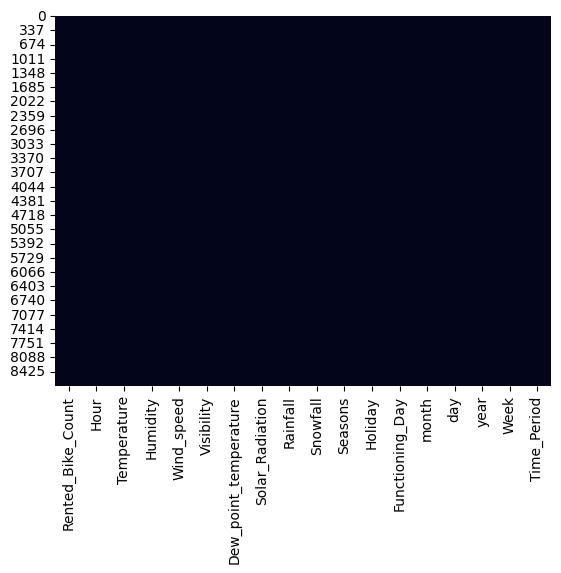

In [ ]:
# Handling Missing Values & Missing Value Imputation
bike_data.isnull().sum()
sns.heatmap(bike_data.isnull(), cbar=False)

#### What all missing value imputation techniques have you used and why did you use those techniques?

Missing Value Imputation Methods were not applied as the data has no missing value.

### 2. Handling Outliers

In [ ]:
bike_data.head(2)

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,month,day,year,Week,Time_Period
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,Working Day,Morning


In [ ]:
# Handling Outliers & Outlier treatments

bike_data['year'] = bike_data.year.astype('str')
symmetric_feature=[]
non_symmetric_feature=[]
for i in bike_data.describe().columns:
  if abs(bike_data[i].mean()-bike_data[i].median())<0.2:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Hour', 'Rainfall', 'Snowfall']
Skew Symmetric Distributed Features : - ['Rented_Bike_Count', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation']


In [ ]:
# For Symmetric features defining upper and lower boundry(normally distributed using std and mean)

def outlier_treatment(df,feature):
  upper_boundary= df[feature].mean()+3*df[feature].std()
  lower_boundary= df[feature].mean()-3*df[feature].std()
  return upper_boundary,lower_boundary

In [ ]:
# Restricting/ capping the data to lower and upper boundry

for feature in symmetric_feature:
  #below lower value then value = lower value
  bike_data.loc[bike_data[feature]<= outlier_treatment(df=bike_data,feature=feature)[1], feature]=outlier_treatment(df=bike_data,feature=feature)[1]
  #above higher value, then value = higher value
  bike_data.loc[bike_data[feature]>= outlier_treatment(df=bike_data,feature=feature)[0], feature]=outlier_treatment(df=bike_data,feature=feature)[0]

In [ ]:
# For Skew Symmetric features defining upper and lower boundry
#Outer Fence
def outlier_treatment_skew(df,feature):
  IQR= df[feature].quantile(0.75)- df[feature].quantile(0.25)
  lower_bridge =df[feature].quantile(0.25)-1.5*IQR
  upper_bridge =df[feature].quantile(0.75)+1.5*IQR

  return upper_bridge,lower_bridge

In [ ]:
# Restricting the data to lower and upper boundry
for feature in non_symmetric_feature:
  bike_data.loc[bike_data[feature]<= outlier_treatment_skew(df=bike_data,feature=feature)[1], feature]=outlier_treatment_skew(df=bike_data,feature=feature)[1]
  bike_data.loc[bike_data[feature]>= outlier_treatment_skew(df=bike_data,feature=feature)[0], feature]=outlier_treatment_skew(df=bike_data,feature=feature)[0]


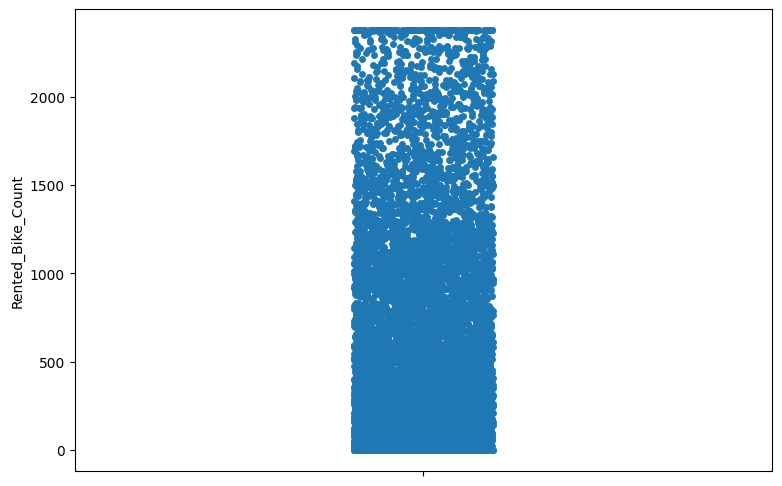

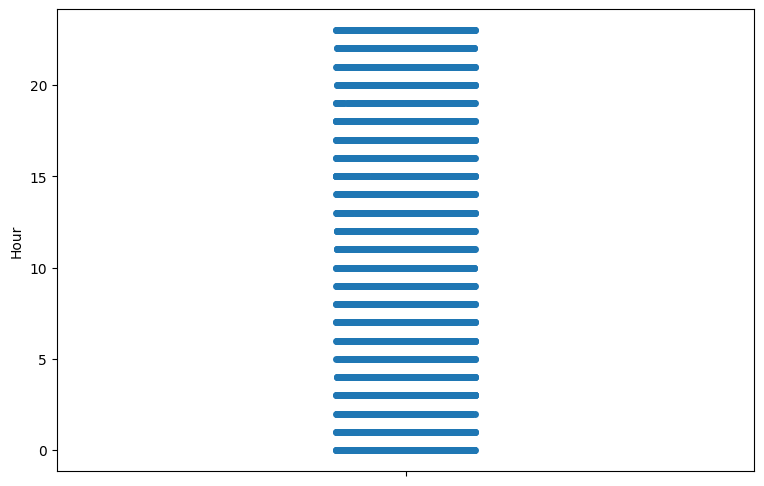

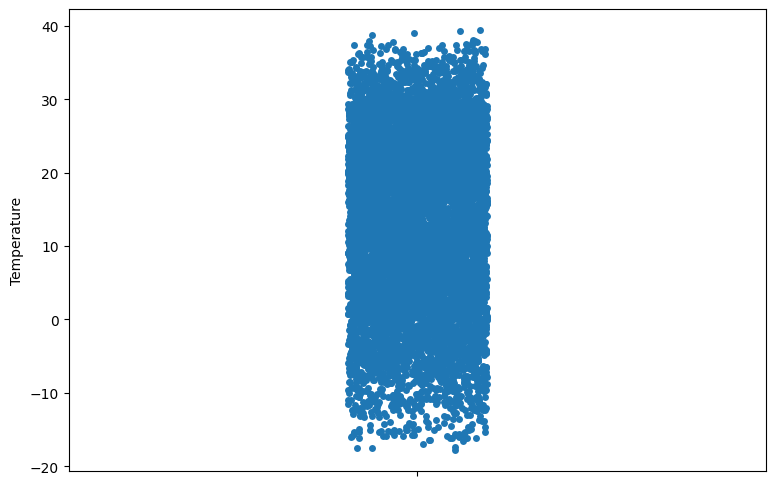

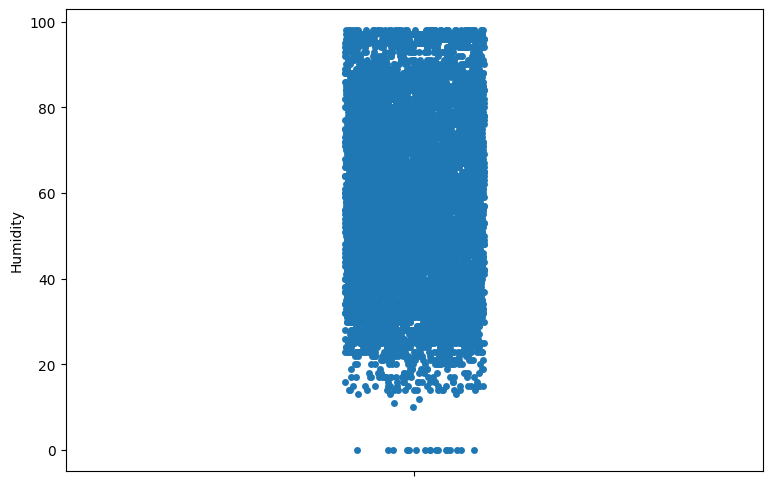

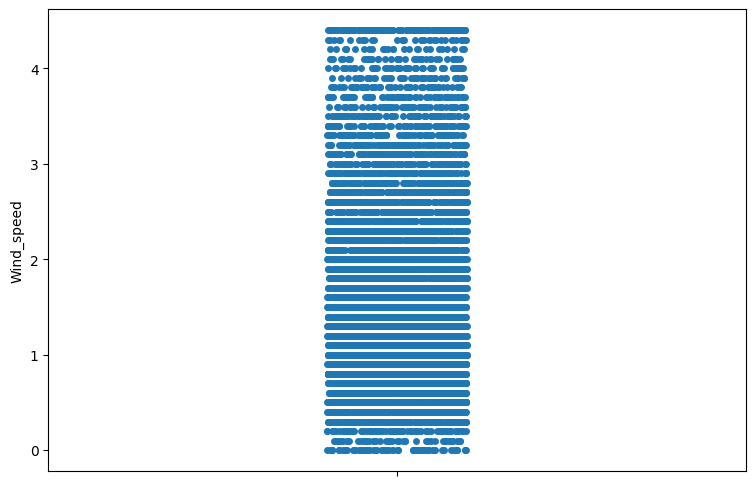

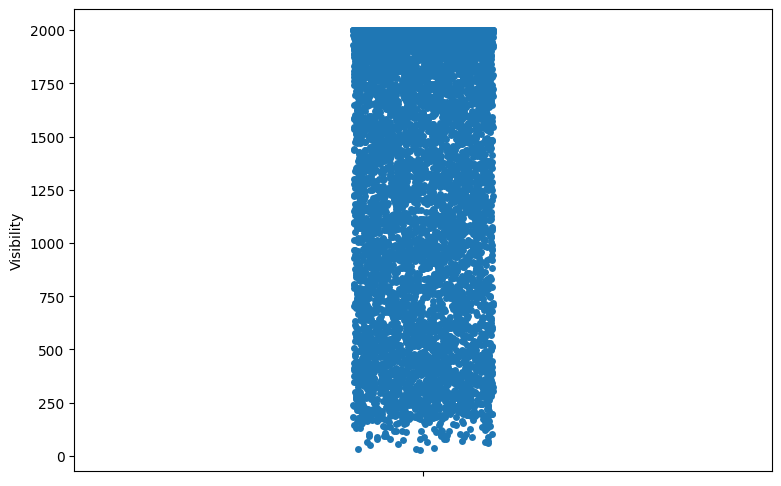

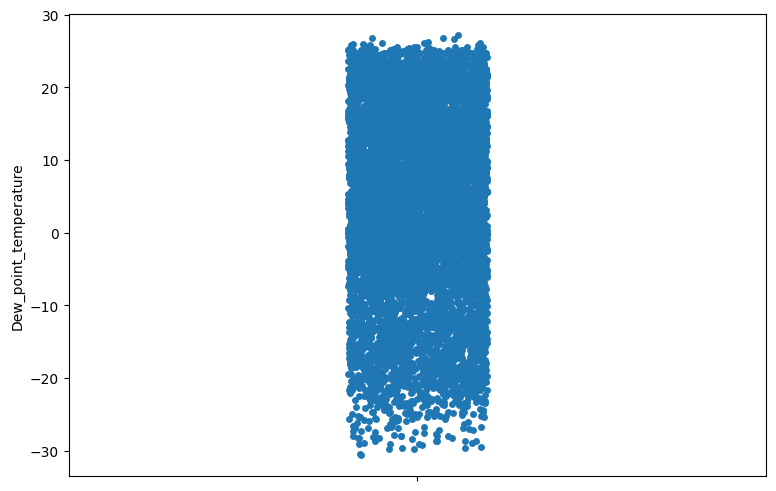

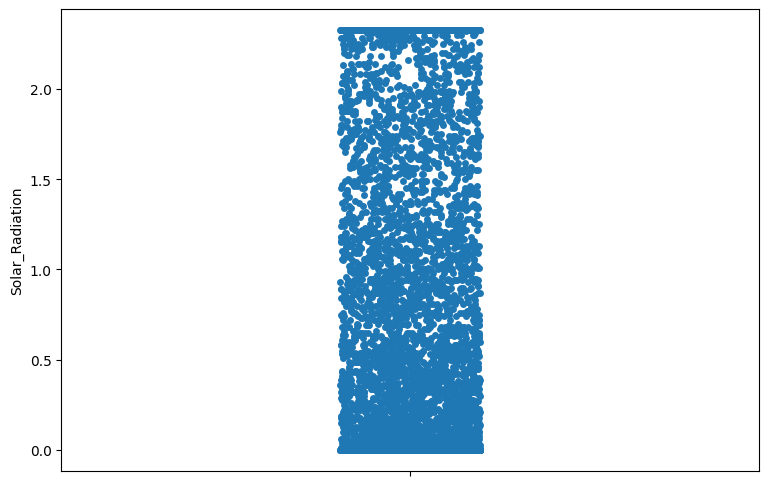

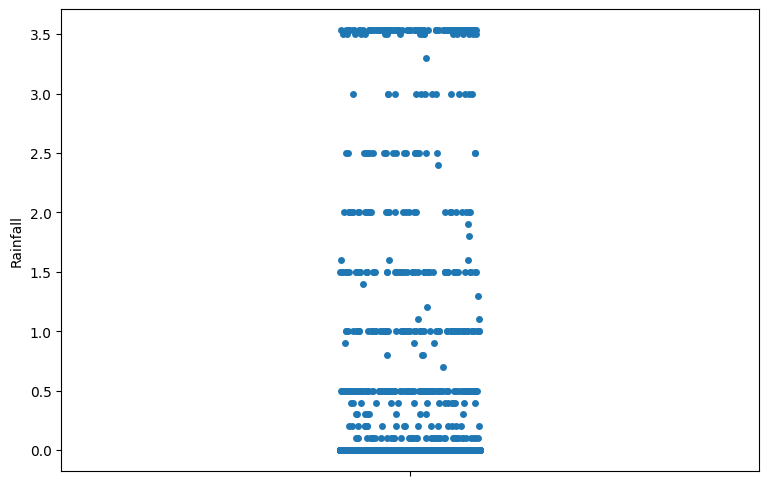

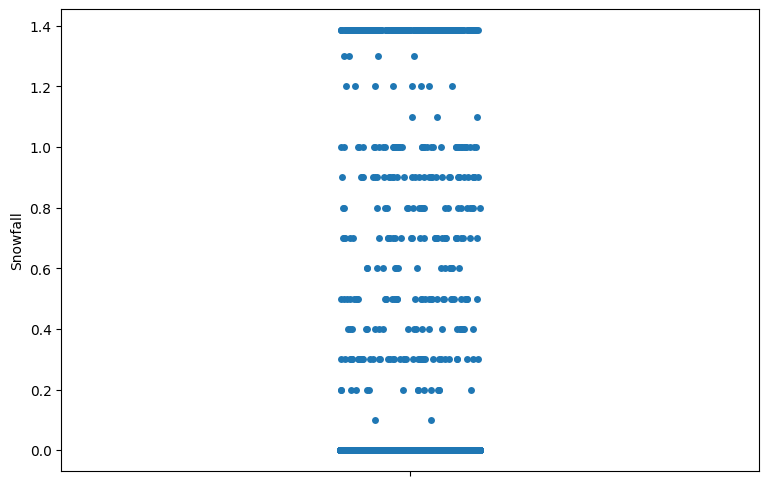

In [ ]:
# After Outlier Treatment showing the dataset distribution using strip plot
# Visualising  code for the numerical columns
for col in bike_data.describe().columns:
  fig=plt.figure(figsize=(9,6))
  sns.stripplot(bike_data[col])

##### What all outlier treatment techniques have you used and why did you use those techniques?

In the present context for handling the outliers, two different methods are used which are briefly discussed later. First of the the symmetric and skew-symmetric features are differentiated. This differentiated data is channelled though the upper and lower bounds. The upper and lower bounds are emcompassed with the help of these following methods.


1.  **Normal Distribution using Standard Deviation and Mean**:

In terms of the symmetric distribution, the standard deivation is used for setting up the lower and upper bound. This helps in limiting the values of data which falls into this specific range calculated throgh the mean and standard deivation of the data. Here, the range is:

*   upper_boundary= feature.mean()+3*feature.std()
*   lower_boundary= feature.mean()-3*feature.std()



2.   **Skew Symmetric Distribution with Interquartile Range**:

In the Skew Symmetric Distribution, the 1st Quartile and 3rd Quartile range is used for setting up the lower and upper bound of the data. This data is limited between the range
  
*   lower_bridge =feature.quantile(0.25)-1.5*IQR
*   upper_bridge =feature.quantile(0.75)+1.5*IQR

where IQR= feature.quantile(0.75)-feature.quantile(0.25)

### 3. Categorical Encoding

In [ ]:
# differing the categorical columns
cat_category = bike_data.select_dtypes(include = 'object')
print(f'Categorial Features: {cat_category.columns.to_list()}')

Categorial Features: ['Seasons', 'Holiday', 'Functioning_Day', 'month', 'day', 'year', 'Week', 'Time_Period']


In [ ]:
dff = bike_data.copy()

In [ ]:
dd = bike_data.copy()

In [ ]:
#deleting extra feature
dff.drop(columns = ['day','Time_Period','year','month'], axis =1, inplace = True)

In [ ]:
# Encode your categorical columns
dff = pd.get_dummies(dff, drop_first = True)
dff.head(1)

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday,Functioning_Day_Yes,Week_Working Day
0,254.0,0.0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,False,False,True,True,True,True


#### What all categorical encoding techniques have you used & why did you use those techniques?

**'get_dummies' function**: The function is used for encoding the data in terms of true and false for different categorical values. The necessary columns were created using this data for getting better features for the data which will be later used for manipulation and selection of features.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features


#creating function to use dew point and temperature to calculate absolute humidity
import math

def absolute_humidity(df, temperature_column, dew_point_column):
  '''
  In this feature manipulation, dew point temperature and temperature is used to calculate the absolute humidity.
  This is essential as both the variables are highly correlated.
  Hence, the variables are composed in one variable of the data.
  '''

  # constants
  a = 17.27
  b = 237.7

  # create a new column for absolute humidity
  df['Absolute_Humidity'] = None

  # iterate over the rows of the DataFrame
  for index, row in df.iterrows():
    temperature = row[temperature_column]
    dew_point = row[dew_point_column]

    # check for dew point equal to or higher than temperature
    if dew_point >= temperature:
      # set absolute humidity to zero to prevent division by zero
      df.at[index, 'Absolute_Humidity'] = 0.0
    else:
      # calculate saturation vapor pressure
      svp = (a * dew_point) / (b + dew_point)

      # check for temperature equal to zero
      if temperature == 0:
        # set absolute humidity to zero to prevent division by zero
        df.at[index, 'Absolute_Humidity'] = 0.0
      else:
        # calculate absolute humidity
        ah = 6.112 * svp * math.exp((a * temperature) / (b + temperature)) / temperature

        # store the absolute humidity in the new column
        df.at[index, 'Absolute_Humidity'] = ah

  return df


In [ ]:
dff = absolute_humidity(dff, 'Temperature', 'Dew_point_temperature') #Feature Transformation

In [ ]:
#changing data type as there was an error while using isinf
dff['Absolute_Humidity'] = dff.Absolute_Humidity.astype('int') #Changing the format of the new variable to integer

In [ ]:
#replacing infinity with 0
np.isinf(dff).values.sum()
dff.replace([np.inf, -np.inf], 0, inplace=True)

In [ ]:
dff = dff.drop(dff[dff['Functioning_Day_Yes'] == 0].index) #dropping unnecessary data

In [ ]:
dff.drop(columns = ['Functioning_Day_Yes'], axis =1, inplace = True) #dropping unnecessary data

#### 2. Feature Selection

In [ ]:
dd.shape

(8760, 18)

In [ ]:
# Selecting features to avoid overfitting

# Dropping Constant and Quasi Constant Feature
def dropping_constant(data):
  from  sklearn.feature_selection import VarianceThreshold
  var_thres= VarianceThreshold(threshold=0.05)
  var_thres.fit(data)
  concol = [column for column in data.columns
          if column not in data.columns[var_thres.get_support()]] #var_thres.get_support() is used checking condition from boolean output
  print(f'Columns dropped: {concol}')
  df_removed_var=data.drop(concol,axis=1)
  return df_removed_var

In [ ]:
# Calling the function
df_removed_var=dropping_constant(dff)

Columns dropped: ['Holiday_No Holiday']


In [ ]:
# Checking the shape after feature dropped
df_removed_var.shape

(8465, 15)

In [ ]:
# Correlation Heatmap visualization code
corr = df_removed_var.corr()
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1) \
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'}) \
    .set_caption("Hover to magify") \
    .format("{:.2f}".format) \
    .set_table_styles(magnify())

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Seasons_Summer,Seasons_Winter,Week_Working Day,Absolute_Humidity
Rented_Bike_Count,1.00,0.43,0.57,-0.20,0.13,0.21,0.41,0.29,-0.19,-0.19,0.02,0.28,-0.47,0.04,0.04
Hour,0.43,1.00,0.12,-0.24,0.29,0.10,0.00,0.15,0.00,-0.03,-0.00,-0.00,-0.00,-0.00,0.00
Temperature,0.57,0.12,1.00,0.17,-0.04,0.03,0.91,0.35,0.06,-0.28,0.01,0.68,-0.74,-0.01,0.10
Humidity,-0.20,-0.24,0.17,1.00,-0.34,-0.55,0.54,-0.46,0.34,0.08,0.02,0.20,-0.24,0.02,0.05
Wind_speed,0.13,0.29,-0.04,-0.34,1.00,0.18,-0.18,0.34,-0.05,0.02,0.07,-0.06,0.11,0.02,-0.02
Visibility,0.21,0.10,0.03,-0.55,0.18,1.00,-0.18,0.15,-0.25,-0.10,-0.19,0.07,0.01,0.03,0.01
Dew_point_temperature,0.41,0.00,0.91,0.54,-0.18,-0.18,1.00,0.09,0.17,-0.22,0.01,0.66,-0.72,0.00,0.11
Solar_Radiation,0.29,0.15,0.35,-0.46,0.34,0.15,0.09,1.00,-0.11,-0.08,0.07,0.13,-0.18,-0.01,0.01
Rainfall,-0.19,0.00,0.06,0.34,-0.05,-0.25,0.17,-0.11,1.00,-0.01,0.05,0.06,-0.09,0.01,0.02
Snowfall,-0.19,-0.03,-0.28,0.08,0.02,-0.10,-0.22,-0.08,-0.01,1.00,-0.12,-0.13,0.30,0.04,0.02


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
# Manipulate Features to minimize feature correlation
# Calculating VIF
def calc_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)
calc_vif(df_removed_var[[i for i in df_removed_var.describe().columns if i not in ['Rented_Bike_Count']]])

,variables,VIF
0,Hour,4.416486
1,Temperature,33.248005
2,Humidity,5.588976
3,Wind_speed,5.034652
4,Visibility,9.145143
5,Dew_point_temperature,17.365104
6,Solar_Radiation,2.954431
7,Rainfall,1.181982
8,Snowfall,1.180115
9,Absolute_Humidity,1.022836


**Multicolinearity**

In [ ]:
# Check Feature Correlation and finding multicolinearity
def correlation(df,threshold):
  '''
  Checking Multicolinearity for Feature Selection
  '''
  col_corr=set()
  corr_matrix= df.corr()
  for i in range (len(corr_matrix.columns)):
    for j in range(i):
      if abs (corr_matrix.iloc[i,j])>threshold:
        colname=corr_matrix.columns[i]
        col_corr.add(colname)
  return list(col_corr)

In [ ]:
correlation(df_removed_var,0.6)

['Dew_point_temperature', 'Seasons_Summer', 'Seasons_Winter']

In [ ]:
# Getting multicolinear columns and dropping them
highly_correlated_columns=correlation(df_removed_var,0.6)


df_removed=df_removed_var.drop(highly_correlated_columns,axis=1)
df_removed.shape

(8465, 12)

In [ ]:
# Correlation after dropping the required columns
# Correlation Heatmap visualization code
corr = df_removed.corr()
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1) \
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'}) \
    .set_caption("Hover to magify") \
    .format("{:.2f}".format) \
    .set_table_styles(magnify())

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Week_Working Day,Absolute_Humidity
Rented_Bike_Count,1.00,0.43,0.57,-0.20,0.13,0.21,0.29,-0.19,-0.19,0.02,0.04,0.04
Hour,0.43,1.00,0.12,-0.24,0.29,0.10,0.15,0.00,-0.03,-0.00,-0.00,0.00
Temperature,0.57,0.12,1.00,0.17,-0.04,0.03,0.35,0.06,-0.28,0.01,-0.01,0.10
Humidity,-0.20,-0.24,0.17,1.00,-0.34,-0.55,-0.46,0.34,0.08,0.02,0.02,0.05
Wind_speed,0.13,0.29,-0.04,-0.34,1.00,0.18,0.34,-0.05,0.02,0.07,0.02,-0.02
Visibility,0.21,0.10,0.03,-0.55,0.18,1.00,0.15,-0.25,-0.10,-0.19,0.03,0.01
Solar_Radiation,0.29,0.15,0.35,-0.46,0.34,0.15,1.00,-0.11,-0.08,0.07,-0.01,0.01
Rainfall,-0.19,0.00,0.06,0.34,-0.05,-0.25,-0.11,1.00,-0.01,0.05,0.01,0.02
Snowfall,-0.19,-0.03,-0.28,0.08,0.02,-0.10,-0.08,-0.01,1.00,-0.12,0.04,0.02
Seasons_Spring,0.02,-0.00,0.01,0.02,0.07,-0.19,0.07,0.05,-0.12,1.00,-0.00,-0.06


In [ ]:
calc_vif(df_removed[[i for i in df_removed.describe().columns if i not in ['Rented_Bike_Count']]])

,variables,VIF
0,Hour,3.960634
1,Temperature,3.286067
2,Humidity,5.108537
3,Wind_speed,4.826942
4,Visibility,4.855810
5,Solar_Radiation,2.310236
6,Rainfall,1.177774
7,Snowfall,1.179819
8,Absolute_Humidity,1.020801


In [ ]:
df_removed.shape

(8465, 12)

In [ ]:
df_removed.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall',
       'Seasons_Spring', 'Week_Working Day', 'Absolute_Humidity'],
      dtype='object')

In [ ]:
from xgboost import XGBRegressor

In [ ]:
# Embedded Method of validating the feature importances of selected features
def randomforest_embedded(x,y):
  # Create the XGBRegressor
  model= XGBRegressor(objective='reg:squarederror')
  # Fit the mmodel
  model.fit(x,y)
  # get the importance of thr resulting features
  importances= model.feature_importances_
  # Create a data frame for visualization
  final_df= pd.DataFrame({"Features": pd.DataFrame(x).columns, "Importances": importances})
  final_df.set_index('Importances')
  # Sort in ascending order to better visualization
  final_df= final_df.sort_values('Importances')
  return final_df

In [ ]:
# Getting feature importance of selected features
pd.options.display.float_format = "{:.5f}".format
randomforest_embedded(x=df_removed.drop(["Rented_Bike_Count"],axis=1),y=df_removed["Rented_Bike_Count"])

,Features,Importances
3,Wind_speed,0.00711
7,Snowfall,0.00873
4,Visibility,0.01076
10,Absolute_Humidity,0.02676
8,Seasons_Spring,0.04125
2,Humidity,0.05713
5,Solar_Radiation,0.08370
9,Week_Working Day,0.11420
1,Temperature,0.17868
0,Hour,0.19925


##### What all feature selection methods have you used  and why?

Several features are dropped for getting better features of the data. The collinearity of these data are tested with the help of correlation functions and VIF calculation.

Correlation is valued as -1 to 1 where 0 shows no correlation and negative and positive values acquire positive and negative correlation.

Variance Inflation Factor(VIF) provides the strengths of the correlation which starts from 1 and has no upper limit. The values being between 1 to 5, provides strong correlation and above 5, the correlation is less and rather questionable.

Using these values, the collinearity between the variables are assesed and it helps in the proper feature selection.  

##### Which all features you found important and why?

According to the methods used mentioned above and processing the XGBooster method for the assessment, the importance of the features are assessed. The ten variables have the feature impotance are

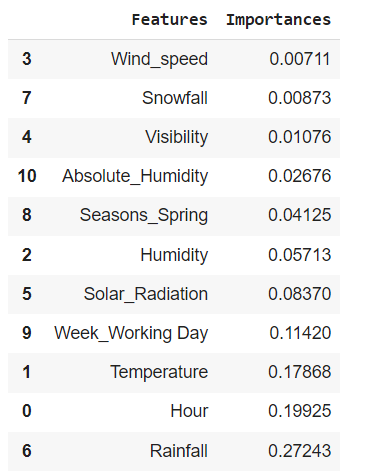

It provides the idea that all the features in the image are important for the processing above.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [ ]:
# Transform Your data
# Getting symmetric and skew symmetric features from the columns
symmetric_feature=[]
non_symmetric_feature=[]
for i in df_removed.describe().columns:
  if abs(df_removed[i].mean()-df_removed[i].median())<0.1:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Rainfall', 'Snowfall']
Skew Symmetric Distributed Features : - ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Solar_Radiation', 'Absolute_Humidity']


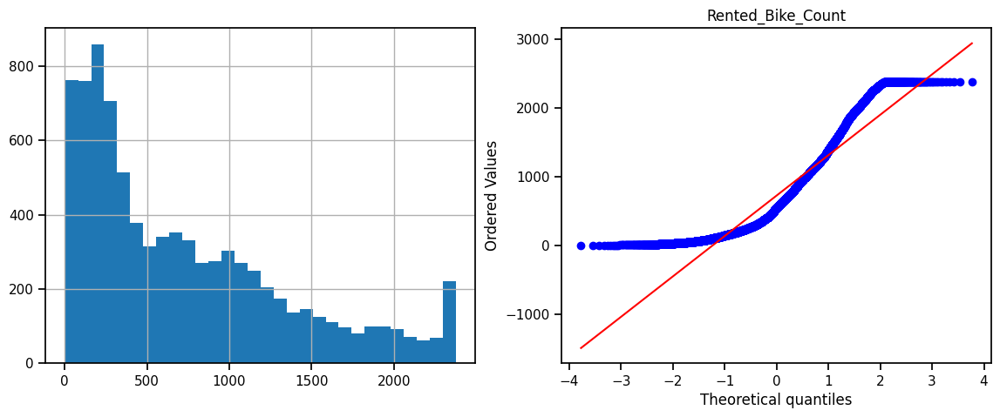

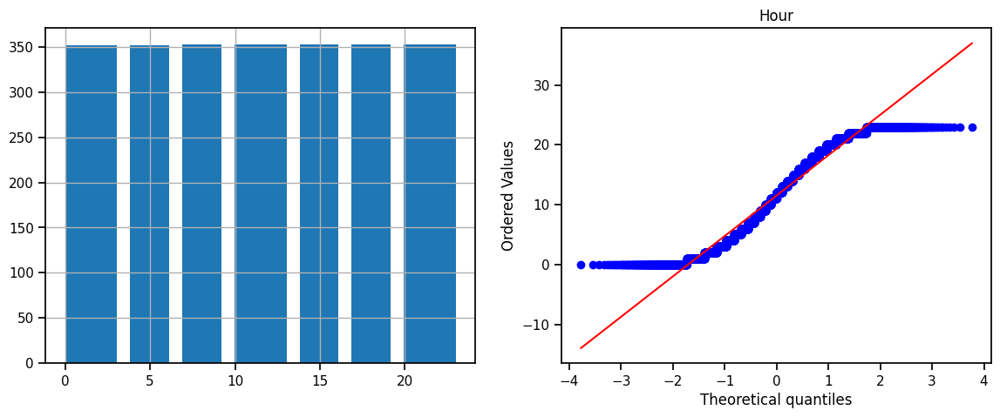

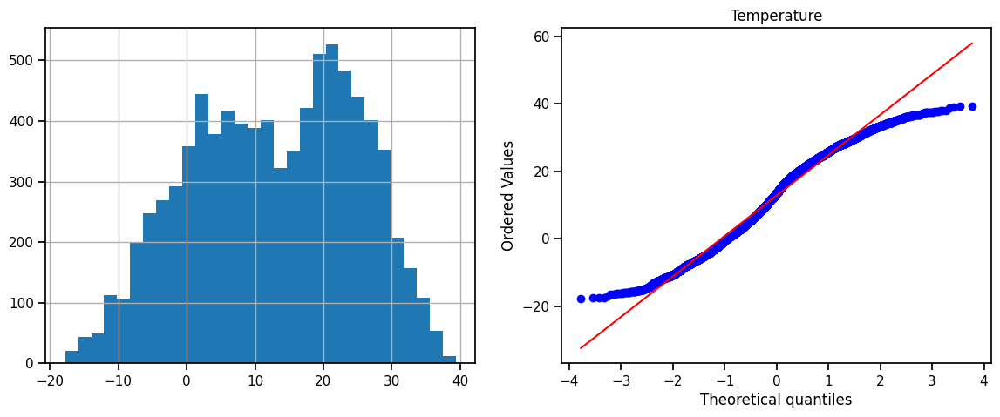

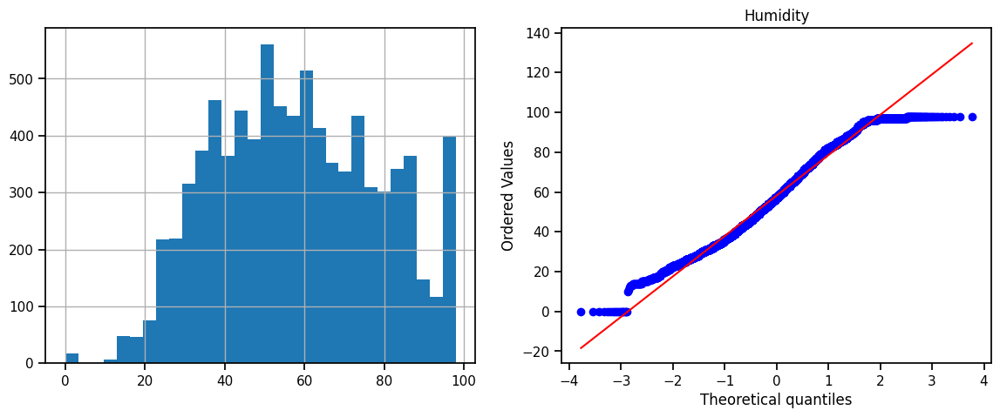

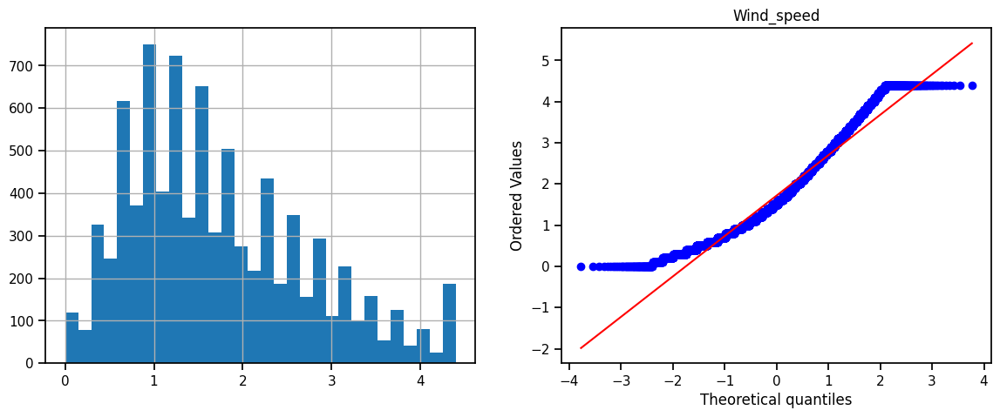

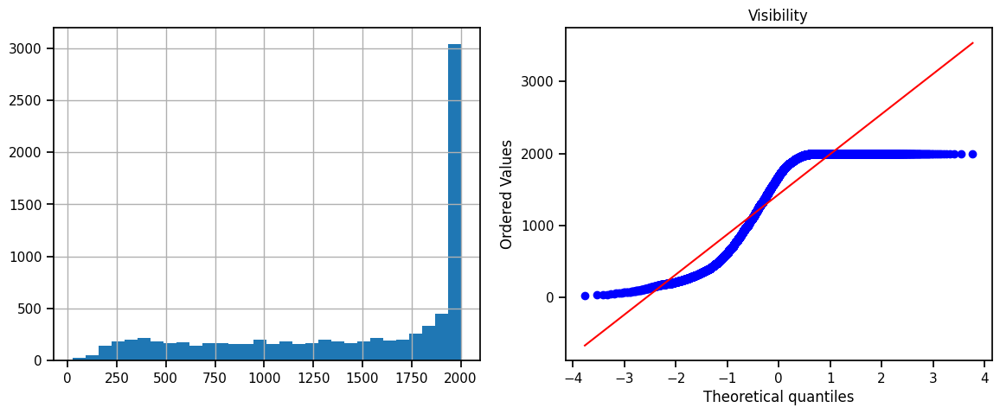

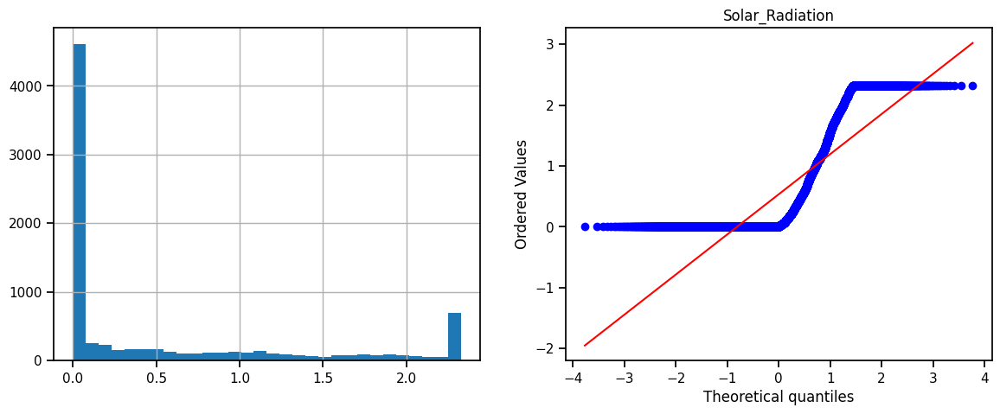

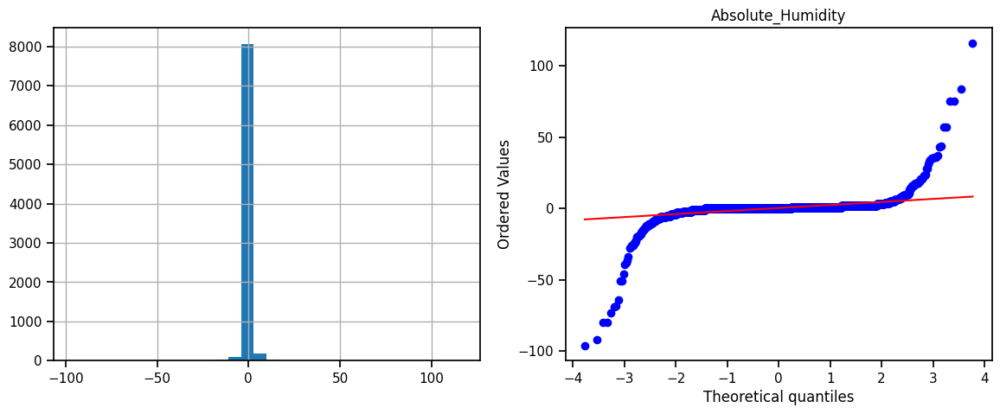

In [ ]:
#vizualization
for variable in non_symmetric_feature:
  sns.set_context('notebook')
  plt.figure(figsize=(14,5))
  plt.subplot(1,2,1)   #means 1 row, 2 Columns and 1st plot
  df_removed[variable].hist(bins=30)

  ##QQ plot
  plt.subplot(1,2,2)
  stats.probplot(df_removed[variable], dist='norm',plot=plt)
  plt.title(variable)
  plt.show()
  print('='*120)

In this context, the variables are transformed using the Log Scale which shows the log distribution of the variables. The responses show necessity to scale the Rented Bike Count and Wind Speed which means, these two variables require data transformation.

In [ ]:
# Transform Your data
df_removed['Wind_speed']=np.cbrt(df_removed['Wind_speed'])
df_removed['Rented_Bike_Count']=np.sqrt(df_removed['Rented_Bike_Count'])

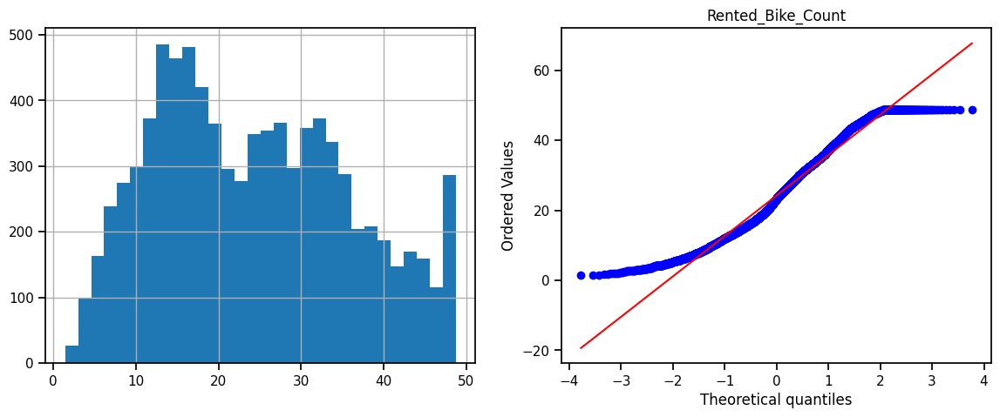

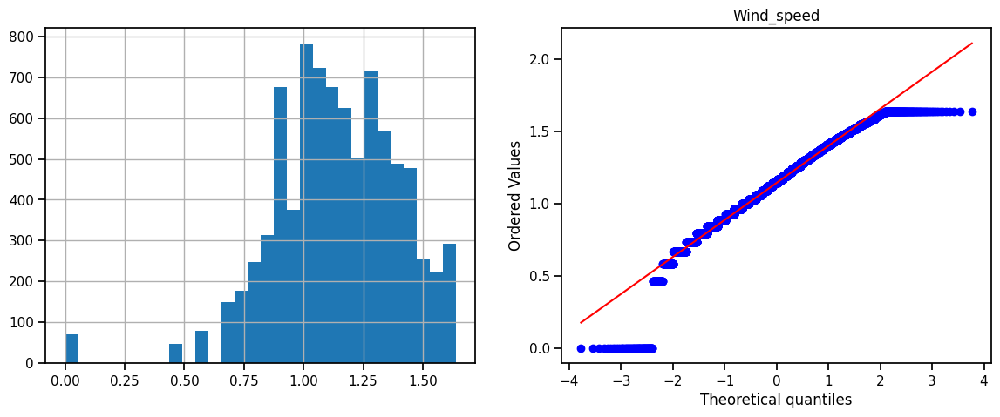

In [ ]:
# Visualizing code of hist plot for each columns to know the data distibution
for col in non_symmetric_feature:
  # if (col == 'Wind_speed'):
  if (col == 'Wind_speed') | (col == 'Rented_Bike_Count'):
    plt.figure(figsize=(14,5))
    plt.subplot(1,2,1)   #means 1 row, 2 Columns and 1st plot
    df_removed[col].hist(bins=30)

    ##QQ plot
    plt.subplot(1,2,2)
    stats.probplot(df_removed[col], dist='norm',plot=plt)
    plt.title(col)
    plt.show()

In this context, the data transforming of the variables Rented Bike Count and Wind Speed are done. This includes the changes for wind speed with cube root values and rented bike count with square root value. This transformation is essential for getting effective results in the later sections and it also helps the data to be scaled in a sutiable range.

### 6. Data Scaling

In [ ]:
# Scaling your data
df_removed.Hour = df_removed.Hour.astype('int')

In [ ]:
# Checking the data
df_removed.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Week_Working Day,Absolute_Humidity
0,15.93738,0,-5.20000,37,1.30059,2000,0.00000,0.00000,0.00000,False,True,1
1,14.28286,1,-5.50000,38,0.92832,2000,0.00000,0.00000,0.00000,False,True,1
2,13.15295,2,-6.00000,39,1.00000,2000,0.00000,0.00000,0.00000,False,True,0
3,10.34408,3,-6.20000,40,0.96549,2000,0.00000,0.00000,0.00000,False,True,0
4,8.83176,4,-6.00000,36,1.32001,2000,0.00000,0.00000,0.00000,False,True,0


<ipython-input-95-dba32c4bd17f>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_removed[col])


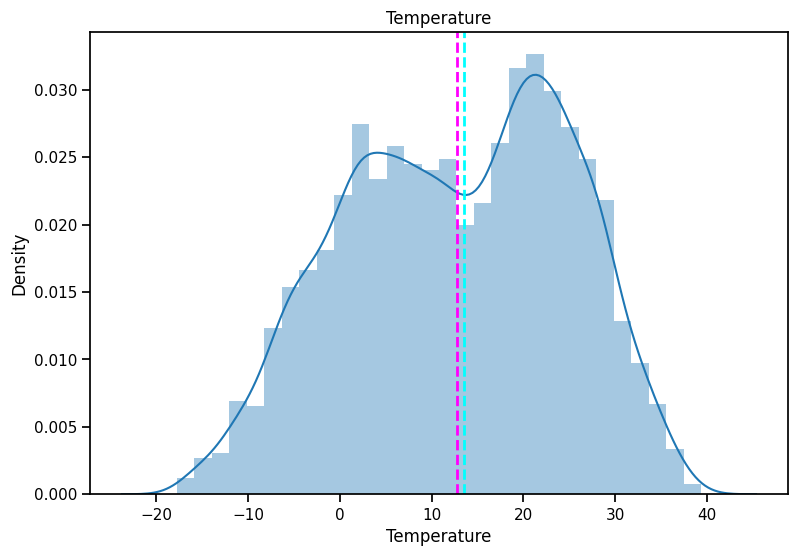

<ipython-input-95-dba32c4bd17f>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_removed[col])


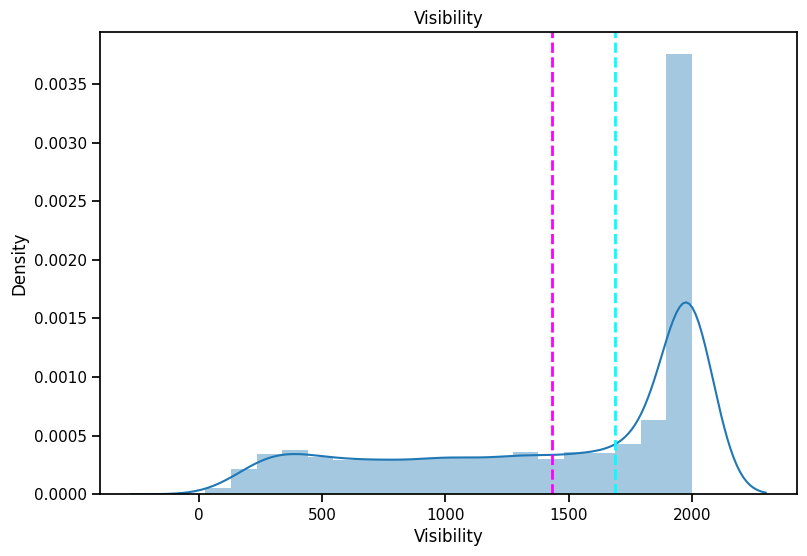

<ipython-input-95-dba32c4bd17f>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_removed[col])


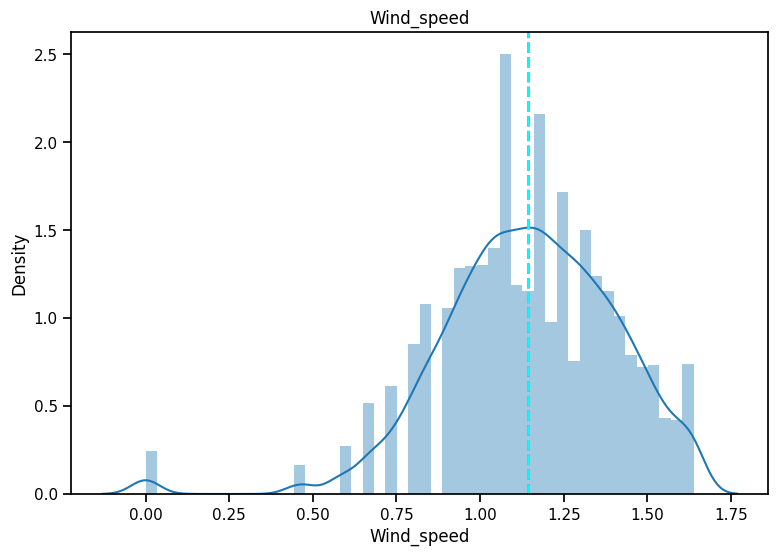

<ipython-input-95-dba32c4bd17f>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_removed[col])


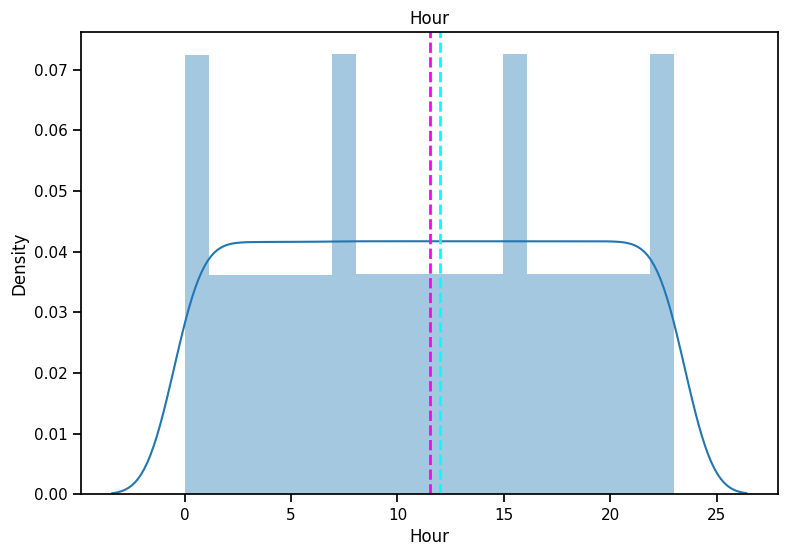

<ipython-input-95-dba32c4bd17f>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_removed[col])


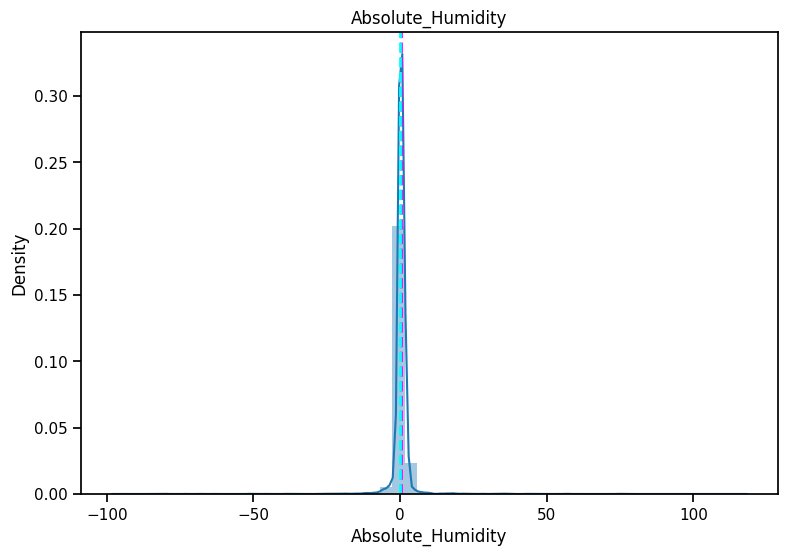

In [ ]:
# Visualizing code of hist plot for each columns to know the data distibution
for col in ['Temperature','Visibility','Wind_speed','Hour','Absolute_Humidity']:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (df_removed[col])
  sns.distplot(df_removed[col])
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(col)
  plt.show()

In [ ]:
df_r = df_removed.copy()

In [ ]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

In [ ]:
#Transformation
for col in non_symmetric_feature:
  if col == 'Rented_Bike_Count':
    pass
  elif col == 'Wind_speed':
    df_r[col] = StandardScaler().fit_transform(df_r[col].values.reshape(-1, 1))
  else:
    df_r[col] = MinMaxScaler().fit_transform(df_r[col].values.reshape(-1, 1))

In [ ]:
df_r.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Week_Working Day,Absolute_Humidity
0,15.93738,0.00000,0.22028,0.37755,0.60111,1.00000,0.00000,0.00000,0.00000,False,True,0.45755
1,14.28286,0.04348,0.21503,0.38776,-0.82405,1.00000,0.00000,0.00000,0.00000,False,True,0.45755
2,13.15295,0.08696,0.20629,0.39796,-0.54963,1.00000,0.00000,0.00000,0.00000,False,True,0.45283
3,10.34408,0.13043,0.20280,0.40816,-0.68175,1.00000,0.00000,0.00000,0.00000,False,True,0.45283
4,8.83176,0.17391,0.20629,0.36735,0.67543,1.00000,0.00000,0.00000,0.00000,False,True,0.45283


##### Which method have you used to scale you data and why?

Standard Scaler Method is used for standardisation of the wind speed variable as it showed normal distribution. In case of other variables, normalisation is done with MinMax Scaler as these does not show normal distribution.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

This data does not require dimensionality reduction as the data is 2-dimensional. This data also has limited features and most of the features are already reduced in feature selection process.

### 8. Data Splitting

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.

# split into 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(
    df_r.drop("Rented_Bike_Count",axis=1),df_r["Rented_Bike_Count"],
    test_size = 0.3, random_state = 0)

# describes info about train and test set
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (5925, 11)
Number transactions y_train dataset:  (5925,)
Number transactions X_test dataset:  (2540, 11)
Number transactions y_test dataset:  (2540,)


##### What data splitting ratio have you used and why?

70:30 Split Ratio is used in this case, as it defines the effective measure in terms of variance. The ratio is useeful to train the data effectively in the following machine learning model and it also provides support to deliver better results for the accuracy scores.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.


The present data cannot be considered as imbalanced Data as the imbalanced variables were already removed. Data imbalance mostly affects classification problems. In the present context, regression analysis is being done which does not require balanced data.

## ***7. ML Model Implementation***

### ML Model - 1

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
# ML Model - 1 Implementation
rmodel = LinearRegression()
# Fit the Algorithm
rmodel.fit(X_train, y_train)

LinearRegression()

In [ ]:
#score
rmodel.score(X_train, y_train)

0.6090434231686099

In [ ]:
# Checking the coefficients
rmodel.coef_

array([ 11.80028886,  34.94284619, -11.69464388,  -0.08311259,
         0.59725436,  -1.77406354,  -5.66480089,  -0.29312515,
         0.83199544,   1.50136317, -10.5375173 ])

In [ ]:
# Checking the intercept value
rmodel.intercept_

10.65965006934709

In [ ]:
# Predict on the model
y_pred_train = rmodel.predict(X_train)
y_pred = rmodel.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae

In [ ]:
# Metric Score chart for train
r2_train = r2(y_train, y_pred_train)
adj_r2_train = 1-(1-r2(np.square(y_train), np.square(y_pred_train)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_train = mse(y_train, y_pred_train)
RMSE_train = np.sqrt(MSE_train)
MAE_train = mae(y_train, y_pred_train)

In [ ]:
# Metric Score chart for test
r2_test = r2(y_test, y_pred)
adj_r2_test = 1-(1-r2(np.square(y_test), np.square(y_pred)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_test = mse(y_test, y_pred)
RMSE_test = np.sqrt(MSE_test)
MAE_test = mae(y_test, y_pred)

In [ ]:
data = [
    {
        'Model': 'Linear_Regression',
        'R2_train': r2_train,
        'R2_test': r2_test,
        'Adjusted_R2_train': adj_r2_train,
        'Adjusted_R2_test': adj_r2_test,
        'MAE_train': MAE_train,
        'MAE_test': MAE_test,
        'RMSE_train': RMSE_train,
        'RMSE_test': RMSE_test
    }
]
result = pd.DataFrame(data)
result

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566


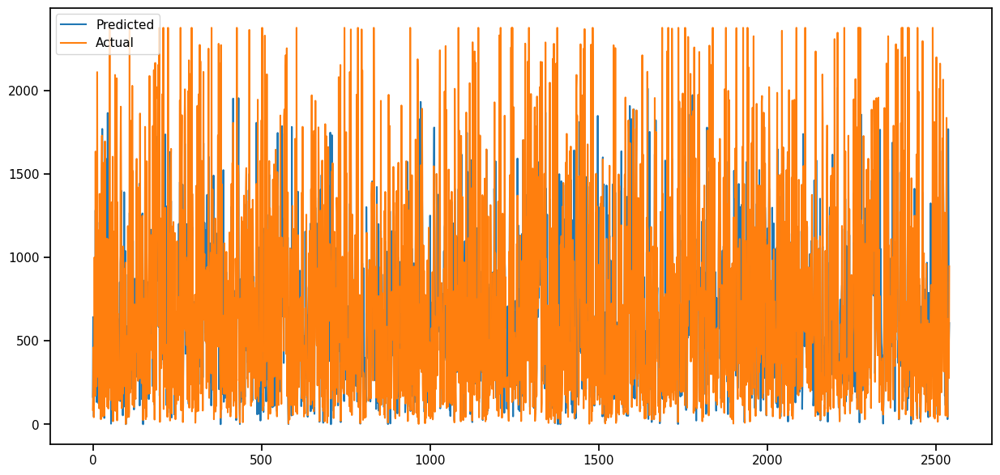

In [ ]:
#Visualization
# Plot between actual target variable vs Predicted one

plt.figure(figsize=(15,7))
plt.plot(np.square(y_pred))
plt.plot(np.array(np.square(y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

The R2 scores show that the model is doing effecive results in terms of defining the variance. The MAE and RMSE scores depict that the model does not show effective results for predicting the values.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Create the model
model = LinearRegression()

# Define the hyperparameter grid
param_grid = {'copy_X' : [True, False],
                'fit_intercept' : [True, False],
                'n_jobs' : [1,2,3],
                'positive' : [True, False]}

# Create the grid search object
grid_search = GridSearchCV(model, param_grid, cv=5,scoring = 'r2')

# Fit the grid search object to the training data
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Print the best hyperparameters
print(best_params)

{'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': False}


In [ ]:
# Fit the Algorithm

best_model = LinearRegression(copy_X = True, fit_intercept = True, n_jobs = 1, positive = False)

# Fit the best model to the training data
best_model.fit(X_train, y_train)

LinearRegression(n_jobs=1)

In [ ]:
# Predict on the model
y_pred_train2 = best_model.predict(X_train)
y_pred2 = best_model.predict(X_test)

In [ ]:
best_model.score(X_train, y_train)

0.6090434231686099

In [ ]:
# Metric Score chart for train
r2_train2 = r2(y_train, y_pred_train2)
adj_r2_train2 = 1-(1-r2(np.square(y_train), np.square(y_pred_train2)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_train2 = mse(y_train, y_pred_train2)
RMSE_train2 = np.sqrt(MSE_train2)
MAE_train2 = mae(y_train, y_pred_train2)

# Metric Score chart for test
r2_test2 = r2(y_test, y_pred2)
adj_r2_test2 = 1-(1-r2(np.square(y_test), np.square(y_pred2)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_test2 = mse(y_test, y_pred2)
RMSE_test2 = np.sqrt(MSE_test2)
MAE_test2 = mae(y_test, y_pred2)

new_row = {
        'Model': 'Linear_Regression_GridCV',
        'R2_train': r2_train2,
        'R2_test': r2_test2,
        'Adjusted_R2_train': adj_r2_train2,
        'Adjusted_R2_test': adj_r2_test2,
        'MAE_train': MAE_train2,
        'MAE_test': MAE_test2,
        'RMSE_train': RMSE_train2,
        'RMSE_test': RMSE_test2
    }
result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

In [ ]:
result

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
1,Linear_Regression_GridCV,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566


##### Which hyperparameter optimization technique have you used and why?

In this context, the GridSearchCV hyperparameter tuning is used for making better training of the model. The best model parameter are chosen through r2 scoring and those are used for developing the prediction model of machine learning.

This optimisation tool shows effective development in the scores if the data is properly featured and other data operations like scaling are effectively done.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

The data being skewed, the scaling and transformation were also played effective role. The choice of the parameters also showed effective outputs. At the end, the score chart were not much improved due to the normalisation of the model fit.

### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
# ML Model - 2 Implementation
# Create an instance of the RandomForestRegressor
rf_model = RandomForestRegressor()

# Fit the Algorithm
rf_model.fit(X_train,y_train)

# Predict on the model
# Making predictions on train and test data
y_pred_train3 = rf_model.predict(X_train)
y_pred3 = rf_model.predict(X_test)

In [ ]:
# Metric Score chart for train
r2_train3 = r2(y_train, y_pred_train3)
adj_r2_train3 = 1-(1-r2(np.square(y_train), np.square(y_pred_train3)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_train3 = mse(y_train, y_pred_train3)
RMSE_train3 = np.sqrt(MSE_train3)
MAE_train3 = mae(y_train, y_pred_train3)

# Metric Score chart for test
r2_test3 = r2(y_test, y_pred3)
adj_r2_test3 = 1-(1-r2(np.square(y_test), np.square(y_pred3)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_test3 = mse(y_test, y_pred3)
RMSE_test3 = np.sqrt(MSE_test3)
MAE_test3 = mae(y_test, y_pred3)

new_row = {
        'Model': 'RandomForestRegressor',
        'R2_train': r2_train3,
        'R2_test': r2_test3,
        'Adjusted_R2_train': adj_r2_train3,
        'Adjusted_R2_test': adj_r2_test3,
        'MAE_train': MAE_train3,
        'MAE_test': MAE_test3,
        'RMSE_train': RMSE_train3,
        'RMSE_test': RMSE_test3
    }
result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

In [ ]:
result

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
1,Linear_Regression_GridCV,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
2,RandomForestRegressor,0.98750,0.89881,0.98676,0.90112,0.87276,2.44684,1.31422,3.70292


In this context, the random forest regressor have been used which shows high R2 scores for both training and test data. MAE and RMSE scores were improved in the test set than in train set which indicates a possible error.

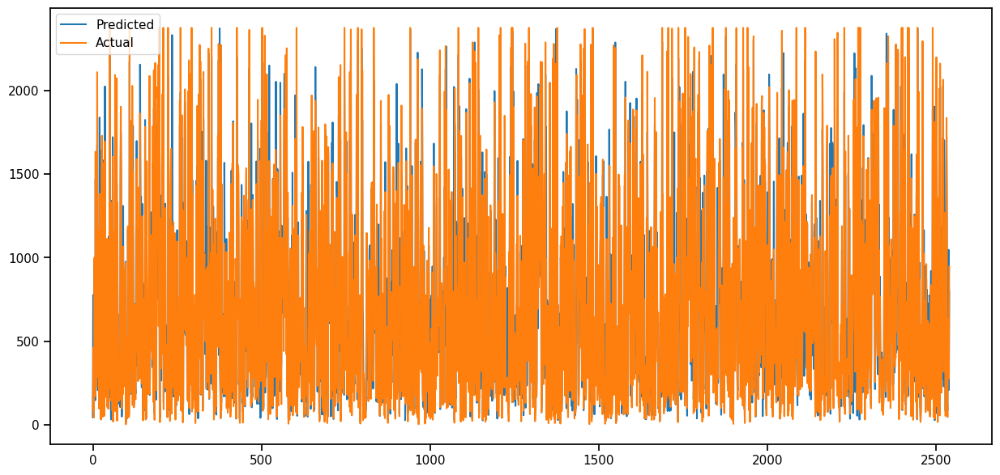

In [ ]:
# Visualizing evaluation Metric Score chart
#Visualization
# Plot between actual target variable vs Predicted one
plt.figure(figsize=(15,7))
plt.plot(np.square(y_pred3))
plt.plot(np.array(np.square(y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

In [ ]:
# ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

# Create an instance of the RandomForestClassifier
rf_model = RandomForestRegressor()

# Grid search
rf_grid = GridSearchCV(estimator=rf_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='r2')


# Fit the Algorithm
rf_grid.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.9s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.0s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   2.2s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.2s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.6s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.5s
[CV] END max_depth=4, min_sam

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 100, 150],
                         'n_estimators': [50, 80, 100]},
             scoring='r2', verbose=2)

In [ ]:
#best parameter
print("Best: %f using %s" % (rf_grid.best_score_, rf_grid.best_params_))

Best: 0.824598 using {'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 100}


In [ ]:
# Predict on the model
# Making predictions on train and test data
y_pred_train4 = rf_grid.predict(X_train)
y_pred4 = rf_grid.predict(X_test)

In [ ]:
# Metric Score chart for train
r2_train4 = r2(y_train, y_pred_train4)
adj_r2_train4 = 1-(1-r2(np.square(y_train), np.square(y_pred_train4)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_train4 = mse(y_train, y_pred_train4)
RMSE_train4 = np.sqrt(MSE_train4)
MAE_train4 = mae(y_train, y_pred_train4)

# Metric Score chart for test
r2_test4 = r2(y_test, y_pred4)
adj_r2_test4 = 1-(1-r2(np.square(y_test), np.square(y_pred4)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_test4 = mse(y_test, y_pred4)
RMSE_test4 = np.sqrt(MSE_test4)
MAE_test4 = mae(y_test, y_pred4)

new_row = {
        'Model': 'RandomForestRegressor_Grid_CV',
        'R2_train': r2_train4,
        'R2_test': r2_test4,
        'Adjusted_R2_train': adj_r2_train4,
        'Adjusted_R2_test': adj_r2_test4,
        'MAE_train': MAE_train4,
        'MAE_test': MAE_test4,
        'RMSE_train': RMSE_train4,
        'RMSE_test': RMSE_test4
    }
result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

In [ ]:
#printing thi result
result

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
1,Linear_Regression_GridCV,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
2,RandomForestRegressor,0.98750,0.89881,0.98676,0.90112,0.87276,2.44684,1.31422,3.70292
3,RandomForestRegressor_Grid_CV,0.84564,0.81278,0.82633,0.79662,3.26003,3.54954,4.61892,5.03676


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV optimisation technique is used as it provides support to deliver hyperparameters through search optimisation. This helps determine some modifications in the data and it delivers effective scores.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Some improvements are observed in the MAE and RMSE scores which indicates lowering the errors in the model. The R2 scores, on the other hand, has been lowered which indicates lack of variacne of the data.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

R2 scores are efficient in terms of variance of the data which indicates the effectivenes of resouce allocation.
MAE and RMSE scores define the effectiveness of prediction which is also defining effectiveness of predictions.

### ML Model - 3

In [ ]:
# ML Model - 3 Implementation
# Create an instance of the RandomForestClassifier
xg_model = XGBRegressor(objective= 'reg:squarederror')

# Fit the Algorithm
xg_models=xg_model.fit(X_train,y_train)

# Predict on the model
# Making predictions on train and test data

y_pred_train5 = xg_models.predict(X_train)
y_pred5 = xg_models.predict(X_test)

In [ ]:
# # Metric Score chart for train
r2_train5 = r2(y_train, y_pred_train5)
adj_r2_train5 = 1-(1-r2(np.square(y_train), np.square(y_pred_train5)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_train5 = mse(y_train, y_pred_train5)
RMSE_train5 = np.sqrt(MSE_train5)
MAE_train5 = mae(y_train, y_pred_train5)

# Metric Score chart for test
r2_test5 = r2(y_test, y_pred5)
adj_r2_test5 = 1-(1-r2(np.square(y_test), np.square(y_pred5)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_test5 = mse(y_test, y_pred5)
RMSE_test5 = np.sqrt(MSE_test5)
MAE_test5 = mae(y_test, y_pred5)

new_row = {
        'Model': 'XGBRegressor',
        'R2_train': r2_train5,
        'R2_test': r2_test5,
        'Adjusted_R2_train': adj_r2_train5,
        'Adjusted_R2_test': adj_r2_test5,
        'MAE_train': MAE_train5,
        'MAE_test': MAE_test5,
        'RMSE_train': RMSE_train5,
        'RMSE_test': RMSE_test5
    }

result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
result

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
1,Linear_Regression_GridCV,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
2,RandomForestRegressor,0.98750,0.89881,0.98676,0.90112,0.87276,2.44684,1.31422,3.70292
3,RandomForestRegressor_Grid_CV,0.84564,0.81278,0.82633,0.79662,3.26003,3.54954,4.61892,5.03676
4,XGBRegressor,0.98198,0.90025,0.97997,0.90032,1.09282,2.44068,1.57815,3.67648


Training R2 score is high and test R2 score is low which indicates effective variance of data. MAE and RMSE scores of training data is lower than test scores which indicates error.

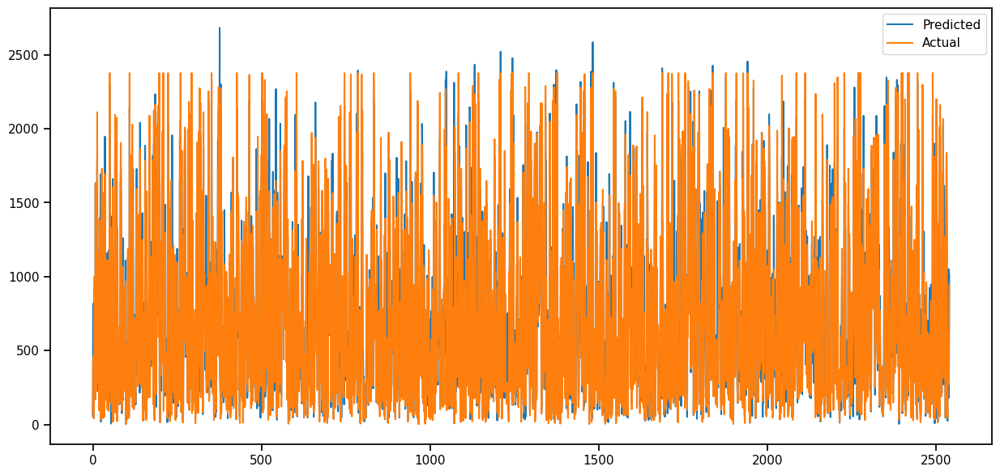

In [ ]:
# Visualizing evaluation Metric Score chart

# Plot between actual target variable vs Predicted one
sns.set_context("notebook");
plt.figure(figsize=(15,7))
plt.plot(np.square(y_pred5))
plt.plot(np.array(np.square(y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

# Create an instance of the RandomForestClassifier
xg_model = XGBRegressor(objective = 'reg:squarederror')

# Fit the Algorithm
# Grid search
xg_grid = GridSearchCV(estimator=xg_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='r2')

xg_grid1=xg_grid.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:47] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:50] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:50] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:51] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:51] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:52] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:54] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.6s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.1s

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)



[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:54:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:02] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:02] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:02] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:02] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.2s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:04] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:05] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   1.0s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.1s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:07] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:11] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:11] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:11] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:11] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:11] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:14] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:14] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.2s

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:14] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:14] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:14] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:16] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:16] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:16] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:18] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:20] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.3s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.2s

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:20] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:20] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:22] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:22] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:22] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:22] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:22] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:22] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.1s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:25] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:25] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:25] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:25] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:25] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:25] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:26] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.2s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:26] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:26] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:26] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:27] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:27] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:27] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:27] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:29] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:29] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:29] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:30] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:37] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:39] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   5.7s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:45] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   8.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:53] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=80; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:55:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   6.0s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   5.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:14] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=100, n_estimators=100; total time=   7.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:26] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:27] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:28] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:29] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:31] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=80; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:33] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:33] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:34] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:35] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:36] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:37] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:37] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:37] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:38] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:38] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:38] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:39] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:39] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:40] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:40] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:40] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:41] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:41] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:41] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:41] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:42] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:42] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:42] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:43] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=80; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:43] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:46] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   1.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:47] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:49] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:52] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:52] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:52] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:53] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:53] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:53] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:53] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:54] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:54] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:54] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=80; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:56:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:57:00] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:57:04] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:57:04] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [06:57:04] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
# Predict on the model
# Making predictions on train and test data

y_pred_train6= xg_grid1.predict(X_train)
y_pred6 = xg_grid1.predict(X_test)

In [ ]:
# # Metric Score chart for train
r2_train6 = r2(y_train, y_pred_train6)
adj_r2_train6 = 1-(1-r2(np.square(y_train), np.square(y_pred_train6)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_train6 = mse(y_train, y_pred_train6)
RMSE_train6 = np.sqrt(MSE_train6)
MAE_train6 = mae(y_train, y_pred_train6)

# Metric Score chart for test
r2_test6 = r2(y_test, y_pred6)
adj_r2_test6 = 1-(1-r2(np.square(y_test), np.square(y_pred6)))*(
    (X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
MSE_test6 = mse(y_test, y_pred6)
RMSE_test6 = np.sqrt(MSE_test6)
MAE_test6 = mae(y_test, y_pred6)

new_row = {
        'Model': 'XGBRegressor_GridCV',
        'R2_train': r2_train6,
        'R2_test': r2_test6,
        'Adjusted_R2_train': adj_r2_train6,
        'Adjusted_R2_test': adj_r2_test6,
        'MAE_train': MAE_train6,
        'MAE_test': MAE_test6,
        'RMSE_train': RMSE_train6,
        'RMSE_test': RMSE_test6
    }

In [ ]:
result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

In [ ]:
result

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
1,Linear_Regression_GridCV,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
2,RandomForestRegressor,0.98750,0.89881,0.98676,0.90112,0.87276,2.44684,1.31422,3.70292
3,RandomForestRegressor_Grid_CV,0.84564,0.81278,0.82633,0.79662,3.26003,3.54954,4.61892,5.03676
4,XGBRegressor,0.98198,0.90025,0.97997,0.90032,1.09282,2.44068,1.57815,3.67648
5,XGBRegressor_GridCV,0.97722,0.90039,0.97487,0.90062,1.22840,2.43998,1.77422,3.67390


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used as it shows effective improvements and it is easy to implement.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

The scores have been improved whihc indicates the XGBRegressor to be the most effective result.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

R2 Scores shows effectiveness of data variance and the RMSE is effective in terms of defining the prediction model. These help in assessing the positive business impact in terms of resource allocation.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [ ]:
#final best result
result.sort_values('R2_test',ascending = False)

,Model,R2_train,R2_test,Adjusted_R2_train,Adjusted_R2_test,MAE_train,MAE_test,RMSE_train,RMSE_test
5,XGBRegressor_GridCV,0.97722,0.90039,0.97487,0.90062,1.22840,2.43998,1.77422,3.67390
4,XGBRegressor,0.98198,0.90025,0.97997,0.90032,1.09282,2.44068,1.57815,3.67648
2,RandomForestRegressor,0.98750,0.89881,0.98676,0.90112,0.87276,2.44684,1.31422,3.70292
3,RandomForestRegressor_Grid_CV,0.84564,0.81278,0.82633,0.79662,3.26003,3.54954,4.61892,5.03676
0,Linear_Regression,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566
1,Linear_Regression_GridCV,0.60904,0.59525,0.54801,0.54033,5.77931,5.83076,7.35086,7.40566


Using XGBRegressor with the GridSearchCV hyperparameter tuning model has been effective in terms of all the scores. This shows effective variance, prediction, and resource allocation of the data.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

In [ ]:
#!pip install shap

In [ ]:
import shap

In [ ]:
#Get shap values
explainer = shap.Explainer(xg_models)
shap_values = explainer(X_test)

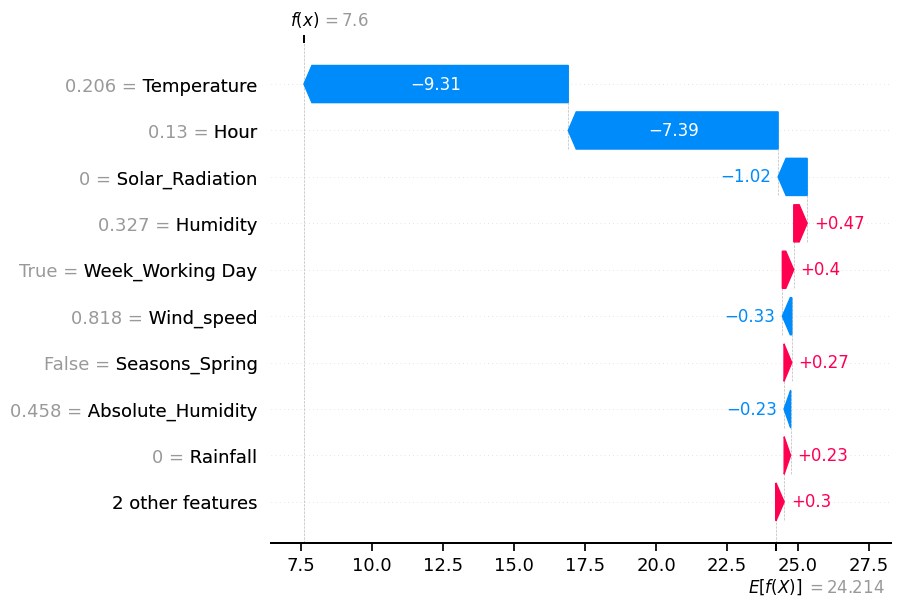

In [ ]:
# Waterfall plot for first observation
shap.plots.waterfall(shap_values[0])

This plot shows how much influence the variables have on the prediction model. This shows that the temperature has the most effect on the prediction which is suitable as we have already observed primarily that the temperature has more collinearity.

In [ ]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()
# Forceplot for first observation
shap.plots.force(shap_values[0])

This also shows that the tempeature has high importance in terms of the predictions.

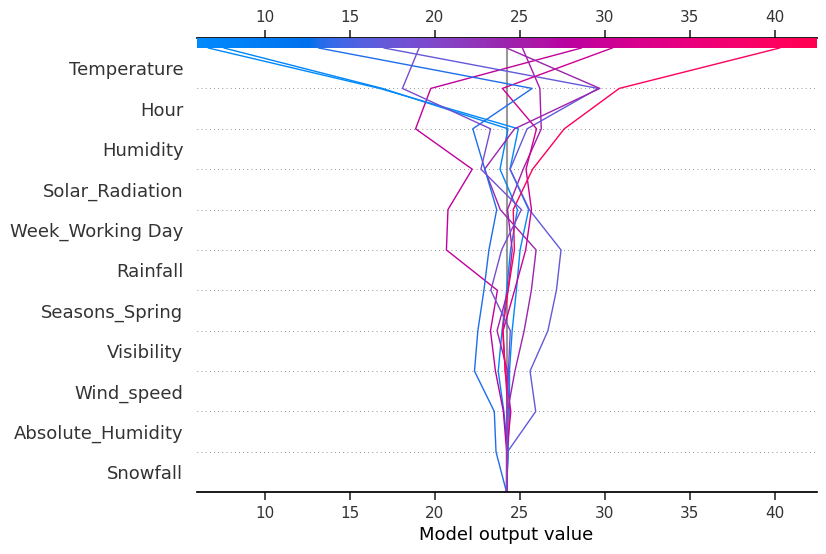

In [ ]:
# Get expected value and shap values array
expected_value = explainer.expected_value
shap_array = explainer.shap_values(X_test)

#Descion plot for first 10 observations
shap.decision_plot(expected_value, shap_array[0:10],feature_names=list(X_test.columns))

This shows that temperature has high variance and this implicates the impact of different variable on model output. The temperature shows effective impact on the predictions.

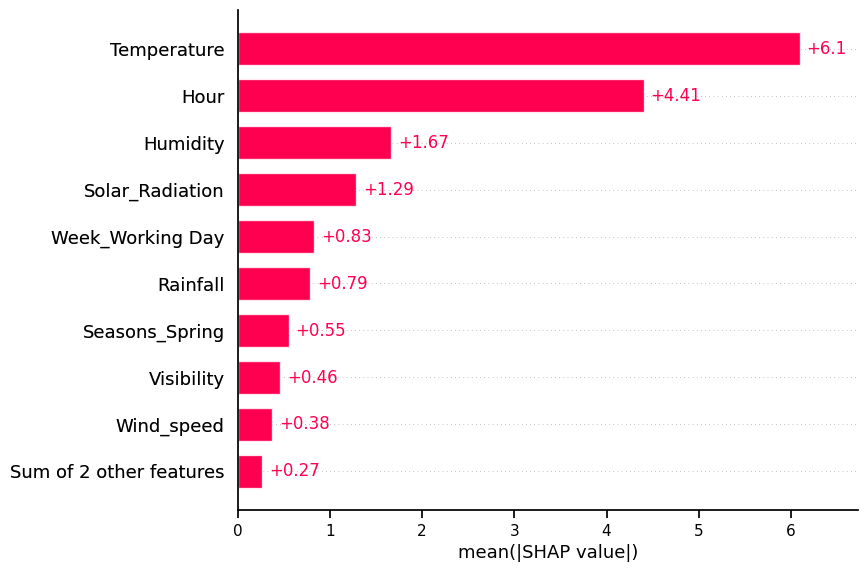

In [ ]:
#Mean SHAP
shap.plots.bar(shap_values)

This also shows how different variables have impact on the prediction based on the SHAP values. The temperature has high impact and the hour has the most impact after that.

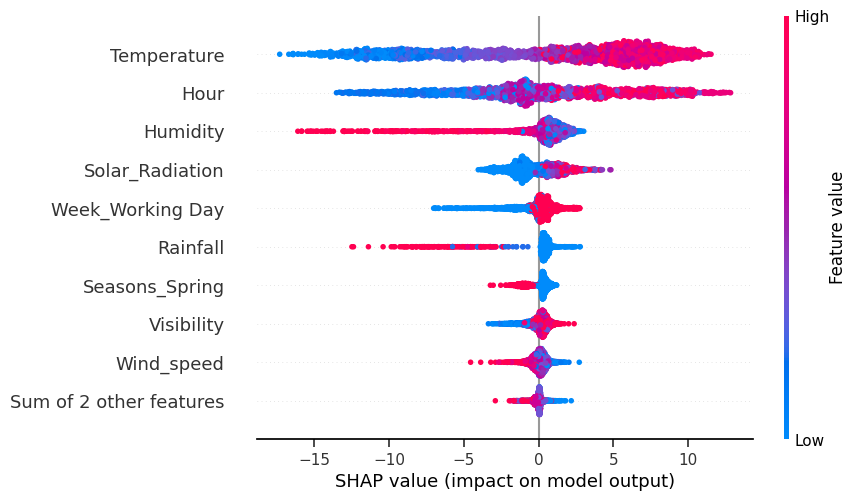

In [ ]:
# Beeswarm plot
shap.plots.beeswarm(shap_values)

The impact on the model output is also shown in the result which is due to the temperature and other variables.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File
import joblib

#Save the model to a file
joblib.dump(xg_grid1, 'model.joblib')

['model.joblib']

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
model

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 100, 150],
                         'n_estimators': [50, 80, 100]},
             scoring='r2', verbose=2)

In [ ]:
# Load the File and predict unseen data.
#Load the model from the file
model = joblib.load('model.joblib')
data = X_test
# Use the model to make predictions
predictions = model.predict(data)

In [ ]:
pred = pd.DataFrame([y_test, predictions])
pred

,651,6951,1815,989,1916,6745,44,1270,5224,3534,...,6923,4912,5055,405,414,6401,5607,5327,4733,2728
Rented_Bike_Count,9.27362,14.89966,21.47091,6.48074,14.59452,31.63858,18.94730,13.03840,40.43513,20.66398,...,34.81379,42.86024,34.77068,12.96148,6.70820,20.07486,25.13961,19.31321,16.64332,30.77337
Unnamed 0,11.80357,NaN,25.43620,17.41251,16.78795,NaN,23.25760,12.41128,NaN,NaN,...,NaN,NaN,NaN,32.42218,38.16928,NaN,NaN,NaN,NaN,NaN


In [ ]:
r2(y_test, predictions)

0.900388511261519

The R2 scores on the prediction model is effective on the test data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

The data analysis has shown the following results:

*   The peak hours for business are 8am and 6pm.
*   The summer is the most effective time for business.
*   June has most business than other months.
*   Night time is the most effective time for business.
*   The number of rented bikes has a linear dependency on the temperature.
*   XGBoost with GridSearchCV model has the most effective accuracy scores which shows effective variance and predictive accuract model.






### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***